In [2]:
from pynwb import NWBHDF5IO
#from nwbwidgets import nwb2widget
import h5py, glob, os
import numpy as np
import matplotlib.pyplot as plt
from dlab import sglx_analysis as sglx
from dlab import psth_and_raster as pr
import numpy as np
import pandas as pd
import os
from tqdm.notebook import tqdm as tqdm
import glob
import pickle as pkl
import json
import datetime as dt
import h5py
from dlab import sglx_analysis as sglx
# import jlh_ephys_tools as jlh
import matplotlib.pyplot as plt
# from open_ephys.analysis import Session
import seaborn as sns




In [3]:
class Eopn3_Ephys:

    def __init__(self,nwb_path):
       self.nwb_path = nwb_path
       self.load_nwb()
       self.structure = StructureData(self)
       self.spiketimes = SpikeTimes(self)
       self.plotter = Eopn3_Plotter(self, self,self)
       self.latency_values_nested = self.plotter.first_spike_latency()
       self.single_neruon_scatter_plot_values = self.plotter.single_neural_latency_list()
       self.start_time_list = self.spiketimes.all_start_times()


    def nwb(self):
        if self.nwb is None:
            self.load_nwb()
        return self.nwb

    def load_nwb(self):
        nwb_path = self.nwb_path
        io = NWBHDF5IO(nwb_path, 'r')
        nwb = io.read()
        self.nwb = nwb
        return self.nwb
    
# prints the metaData associated with nwb
    def view_nwb(self):
        nwb = self.nwb
        print(nwb)

# creates a df of the trails associated with nwb. the Data frame contains data about each trail and its structure 
    def trials(self):
        nwb = self.nwb
        trials_df = nwb.trials.to_dataframe()
        trials_df.loc[2100:2699,'contacts'] = '10r'  #specific to this recording, fixes an error in dataframe
        self.trials_df = trials_df
        return trials_df

# creates the Units Data frame associated with nwb. which contains all the data about the sorted spike units from the recording
    def units(self):
        nwb = self.nwb
        units_df = nwb.units.to_dataframe()
        self.units_df = units_df
        return units_df
    
# creates the optogenetics_states Data frame associated with nwb. which contains all the data about the optogenetics states 
    def optogenetics_states(self):
        nwb = self.nwb
        optogenetics_states_df = nwb.intervals['optogenetics_states'].to_dataframe()
        self.optogenetics_states_df = optogenetics_states_df
        return optogenetics_states_df
    
# creates the epochs Data frame associated with nwb. which contains just the entire recording length. 
    def epochs(self):
        nwb = self.nwb
        epochs_df = nwb.intervals['epochs'].to_dataframe()
        self.epochs_df = epochs_df
        return epochs_df



In [4]:
class Eopn3_Ephys:

    def __init__(self,nwb_path):
       self.nwb_path = nwb_path
       self.load_nwb()
       self.structure = StructureData(self)
       self.spiketimes = SpikeTimes(self)
       self.plotter = Eopn3_Plotter(self, self,self)
    #    self.latency_values_nested = self.plotter.first_spike_latency()
    #    self.single_neruon_scatter_plot_values = self.plotter.single_neural_latency_list()
    #    self.start_time_list = self.spiketimes.all_start_times()


    def nwb(self):
        if self.nwb is None:
            self.load_nwb()
        return self.nwb

    def load_nwb(self):
        nwb_path = self.nwb_path
        io = NWBHDF5IO(nwb_path, 'r')
        nwb = io.read()
        self.nwb = nwb
        return self.nwb
    
# prints the metaData associated with nwb
    def view_nwb(self):
        nwb = self.nwb
        print(nwb)

# creates a df of the trails associated with nwb. the Data frame contains data about each trail and its structure 
    def trials(self):
        nwb = self.nwb
        trials_df = nwb.trials.to_dataframe()
        trials_df.loc[2100:2699,'contacts'] = '10r'  #specific to this recording, fixes an error in dataframe
        self.trials_df = trials_df
        return trials_df

# creates the Units Data frame associated with nwb. which contains all the data about the sorted spike units from the recording
    def units(self):
        nwb = self.nwb
        units_df = nwb.units.to_dataframe()
        self.units_df = units_df
        return units_df
    
    def optogenetics_states(self):
        nwb = self.nwb
        optogenetics_states_df = nwb.intervals['optogenetics_states'].to_dataframe()
        self.optogenetics_states_df = optogenetics_states_df
        return optogenetics_states_df
    
    def epochs(self):
        nwb = self.nwb
        epochs_df = nwb.intervals['epochs'].to_dataframe()
        self.epochs_df = epochs_df
        return epochs_df



    
class StructureData(Eopn3_Ephys):


    def __init__(self,eopn3_ephys):
        self.eopn3_ephys = eopn3_ephys
        self.trials_df = self.eopn3_ephys.trials()

# create a nested list. where each nested is 2D, [start_time, stop_time] for each trail where the LED was ON
    def optogenetics_on_windows(self):
        optogenetics_on = []
        optogenetics_on_window = []
        trials_df = self.eopn3_ephys.trials()

        for index, value in trials_df.iterrows():
            if value["optogenetics_LED_state"] == 1:
                optogenetics_on.append(index)
                start_opto = value['start_time']
                stop_opto = value['stop_time']
                optogenetics_on_window.append([start_opto,stop_opto])
        self.optogenetics_on = optogenetics_on 
        self.optogenetics_on_window = optogenetics_on_window
        return optogenetics_on_window
    
    # create a nested list. where each nested is 2D, [start_time, stop_time] for each trail where the LED was ON
    def visual_stimuli_windows(self):
        visual_stimuli = []
        visual_stimuli_window = []
        trials_df = self.eopn3_ephys.trials()

        for index, value in trials_df.iterrows():
                visual_stimuli.append(index)
                start_visual = value['start_time']
                stop_visual = value['stop_time']
                visual_stimuli_window.append([start_visual,stop_visual])
        self.visual_stimuli = visual_stimuli 
        self.visual_stimuli_window = visual_stimuli_window
        return visual_stimuli_window
    
# create a nested list. where each nested is 2D, [start_time, stop_time] for each trail where the LED was OFF
    def optogenetics_off_windows(self):
        optogenetics_off = []
        optogenetics_off_window = []
        trials_df = self.eopn3_ephys.trials()

        for index, value in trials_df.iterrows():
            if value["optogenetics_LED_state"] == 0:
                    optogenetics_off.append(index)
                    start_opto = value['start_time']
                    stop_opto = value['stop_time']
                    optogenetics_off_window.append([start_opto,stop_opto])

        self.optogenetics_off = optogenetics_off
        self.optogenetics_off_window = optogenetics_off_window

        return optogenetics_off_window
    
    
    def optogenetics_on_duration(self):
        optogenetics_on = []
        optogenetics_on_window = []
        optogenetics_states_df = self.eopn3_ephys.optogenetics_states()

        optogenetics_duration_list = []
        for index, row in optogenetics_states_df.iterrows():
            on = row['start_time']
            off = row['stop_time'] 
            optogenetics_duration_list.append([on,off])
        
        self.optogenetics_duration_list = optogenetics_duration_list
        return optogenetics_duration_list
    
        

class SpikeTimes(Eopn3_Ephys):

    def __init__(self,eopn3_ephys):
        self.eopn3_ephys = eopn3_ephys
        self.plotter = Eopn3_Plotter
        # self.structure_data = structure_data

# Simply prints the spike times column from the units Dataframe
    def find_spike(self):
        units_df = self.eopn3_ephys.units()
        # for index, value in self.units_df.iterrows():
        print(units_df['spike_times'])

# Creates a list that contains just the start time of every trail
    def all_start_times(self):
        units_df = self.eopn3_ephys.units()
        trails_df = self.eopn3_ephys.trials()
        plt.figure(figsize=(10, 6))

        start_time_list = []
        for index, row in trails_df.iterrows():
            event = row['start_time'] 
            start_time_list.append(event)
        
        self.start_time_list = start_time_list

        return start_time_list


                  

class Eopn3_Plotter(Eopn3_Ephys):

      
    def __init__(self, eopn3_ephys, structure_data,spiketimes):
        self.eopn3_ephys = eopn3_ephys
        self.structure_data = structure_data
        self.spiketimes = spiketimes
       

# plots a psth for every neuron over the entire recording
    def all_psth(self):
        plt.figure(figsize=(10, 6))
        self.units_df = self.eopn3_ephys.units()

        # We will iterate over each row (neuron) in the DataFrame
        for index, row in self.units_df.iterrows():
        
            # Each row's 'spike_times' column contains the array of spike times
            spike_times = row['spike_times']

            # We create a y-coordinate array filled with the current index (neuron number),
            # with the same length as the spike_times array
            neuron_numbers = [index] * len(spike_times)
            # Create a scatter plot for this neuron's spike times
            plt.scatter(spike_times, neuron_numbers, s=1)  # s sets the size of the dots
        # After plotting all neurons' spikes, display the plot
        plt.show()


    def all_psth_opto_on(self):
        plt.figure(figsize=(10, 6))
        self.units_df = self.eopn3_ephys.units()

        # We will iterate over each row (neuron) in the DataFrame
        for index, row in self.units_df.iterrows():
        
            # Each row's 'spike_times' column contains the array of spike times
            spike_times = row['spike_times']

            # We create a y-coordinate array filled with the current index (neuron number),
            # with the same length as the spike_times array
            neuron_numbers = [index] * len(spike_times)
            # Create a scatter plot for this neuron's spike times
            plt.scatter(spike_times, neuron_numbers, s=1)  # s sets the size of the dots
        # After plotting all neurons' spikes, display the plot
        plt.show()

# plot the full 3 second trial window. with the red shaded area showing when the optogenetic light was actually ON
    def optogenetic_on_psth(self, otpo_window_number):
        optogenetics_on_duration = self.structure_data.optogenetics_on_duration()
        optogenetics_on_windows = self.structure_data.optogenetics_on_windows()
        units_df = self.eopn3_ephys.units()
        plt.figure(figsize=(10, 6))
        
        # Add the red shaded area only once, outside the loop
        start_time = optogenetics_on_duration[otpo_window_number+2][0]
        stop_time = optogenetics_on_duration[otpo_window_number+2][1]
        visual_stimuli_start = optogenetics_on_windows[otpo_window_number][0]
        visual_stimuli_end = visual_stimuli_start + 0.50
        plt.axvspan(start_time, stop_time, color='red', alpha=0.1, label='Highlighted Time Window')
        plt.axvspan(visual_stimuli_start, visual_stimuli_end, color='gray', alpha=0.2, label='Highlighted Time Window')

        
        for index, row in units_df.iterrows():
            spike_times = [time for time in row['spike_times'] if optogenetics_on_windows[otpo_window_number][0] <= time <= optogenetics_on_windows[otpo_window_number][1]]
            neuron_numbers = [index] * len(spike_times)
            
            plt.scatter(spike_times, neuron_numbers, s=1)  # s sets the size of the dots

        plt.show()
        return 'Optogentic on'

# plot only the short time window in which the optogentic light was actually on
    def optogenetic_duration_psth(self, otpo_window_number,extend_plot_time=0):
        optogenetics_on_duration = self.structure_data.optogenetics_on_duration()
        units_df = self.eopn3_ephys.units()
        plt.figure(figsize=(10, 6))

        # Add the red shaded area only once, outside the loop
        start_time = optogenetics_on_duration[otpo_window_number+2][0]
        stop_time = optogenetics_on_duration[otpo_window_number+2][1]
        print(start_time)
        print(stop_time)
        plot_start_time = start_time - extend_plot_time
        plot_stop_time = stop_time + extend_plot_time

        plt.axvspan(start_time, stop_time, color='red', alpha=0.1, label='Highlighted Time Window')


        for index, row in units_df.iterrows():
            spike_times = [time for time in row['spike_times'] if plot_start_time <= time <= plot_stop_time]
            neuron_numbers = [index] * len(spike_times)
       
            plt.scatter(spike_times, neuron_numbers, s=1)  # s sets the size of the dots

        plt.show()
        return 'Optogentic on'

    def visual_stimuli_duration_psth(self, otpo_window_number,extend_plot_time=0):
        optogenetics_on_duration = self.structure_data.optogenetics_on_duration()
        optogenetics_on_windows = self.structure_data.optogenetics_on_windows()

        units_df = self.eopn3_ephys.units()
        plt.figure(figsize=(10, 6))

        # Add the red shaded area only once, outside the loop
        start_time = optogenetics_on_duration[otpo_window_number+2][0]
        stop_time = optogenetics_on_duration[otpo_window_number+2][1]
        print(start_time)
        print(stop_time)
        visual_stimuli_start = optogenetics_on_windows[otpo_window_number][0]
        visual_stimuli_end = visual_stimuli_start + 0.50
        plot_start_time = visual_stimuli_start - extend_plot_time
        plot_stop_time = visual_stimuli_end + extend_plot_time

        plt.axvspan(visual_stimuli_start, visual_stimuli_end, color='gray', alpha=0.2, label='Highlighted Time Window')
        plt.axvspan(start_time, stop_time, color='red', alpha=0.1, label='Highlighted Time Window')


        for index, row in units_df.iterrows():
            spike_times = [time for time in row['spike_times'] if plot_start_time <= time <= plot_stop_time]
            neuron_numbers = [index] * len(spike_times)
       
            plt.scatter(spike_times, neuron_numbers, s=1)  # s sets the size of the dots

        plt.show()
        return 'Optogentic on'


    def visual_stimuli_range_psth(self, otpo_window_range, extend_plot_time=0):
        optogenetics_on_duration = self.structure_data.optogenetics_on_duration()
        optogenetics_on_windows = self.structure_data.optogenetics_on_windows()
        units_df = self.eopn3_ephys.units()

        plt.figure(figsize=(10, 6))

        # Initialize variables to find the min and max times
        min_start_time = float('inf')
        max_stop_time = -float('inf')

        # Loop through each otpo_window_number in the range to find min and max times
        for otpo_window_number in otpo_window_range:
            start_time = optogenetics_on_duration[otpo_window_number + 2][0]
            stop_time = optogenetics_on_duration[otpo_window_number + 2][1]
            visual_stimuli_start = optogenetics_on_windows[otpo_window_number][0]
            visual_stimuli_end = visual_stimuli_start + 0.50

            min_start_time = min(min_start_time, visual_stimuli_start - extend_plot_time)
            max_stop_time = max(max_stop_time, visual_stimuli_end + extend_plot_time)

            plt.axvspan(visual_stimuli_start, visual_stimuli_end, color='gray', alpha=0.5)
            plt.axvspan(start_time, stop_time, color='red', alpha=0.5)

        # Now plot the spikes, but filter them based on the min_start_time and max_stop_time
        for index, row in units_df.iterrows():
            spike_times = [time for time in row['spike_times'] if min_start_time <= time <= max_stop_time]
            neuron_numbers = [index] * len(spike_times)

            plt.scatter(spike_times, neuron_numbers, s=1)  # s sets the size of the dots

        plt.xlim(min_start_time, max_stop_time)  # Set the x-axis limits
        plt.show()
        return 'Optogentic on'
    

    def all_visual_stimuli_duration_psth(self, otpo_window_range,neuron_range = None, all_visual_stimuli = True,extend_plot_time=0):
        optogenetics_on_duration = self.structure_data.optogenetics_on_duration()
        optogenetics_on_windows = self.structure_data.optogenetics_on_windows()
        all_start_times_list = self.spiketimes.all_start_times()
        print(all_start_times_list)
        units_df = self.eopn3_ephys.units()
        print(all_start_times_list)

        plt.figure(figsize=(10, 6))

          # Filter the DataFrame to include only the specified neurons if neuron_range is provided
        if neuron_range is not None:
            units_df = units_df.loc[neuron_range]
    
        # Initialize variables to find the min and max times
        min_start_time = float('inf')
        max_stop_time = -float('inf')

        # Loop through each otpo_window_number in the range to find min and max times
        for otpo_window_number in otpo_window_range:
            start_time = optogenetics_on_duration[otpo_window_number + 2][0]
            stop_time = optogenetics_on_duration[otpo_window_number + 2][1]
            visual_stimuli_start = optogenetics_on_windows[otpo_window_number][0]
            visual_stimuli_end = visual_stimuli_start + 0.50
            print(start_time)
            min_start_time = min(min_start_time, visual_stimuli_start - extend_plot_time)
            max_stop_time = max(max_stop_time, visual_stimuli_end + extend_plot_time)

            plt.axvspan(visual_stimuli_start, visual_stimuli_end, color='gray', alpha=0.1)
            plt.axvspan(start_time, stop_time, color='red', alpha=0.25)

        # If show_trials is True, add black lines for each trial's start time
     

        if all_visual_stimuli == True:
            for trial in all_start_times_list:
                # trial_start = trial[0]
                # if trial == visual_stimuli_start[]
                trial_end = trial + 0.5  # Extend out 0.5 seconds
                plt.axvspan(trial, trial_end, color='yellow', alpha=0.2)
                dotted_line_time = trial + 0.1  # 100 ms after
                plt.axvline(x=dotted_line_time, color='black', linestyle='--',alpha=0.5)

            else:
                pass

   # Initialize a counter for the total number of spikes
        total_spike_count = 0

          # Now plot the spikes, but filter them based on the min_start_time and max_stop_time
        for index, row in units_df.iterrows():
            spike_times = [time for time in row['spike_times'] if min_start_time <= time <= max_stop_time]
            neuron_numbers = [index] * len(spike_times)
             # Update the total_spike_count
            total_spike_count += len(spike_times)
            
            plt.scatter(spike_times, neuron_numbers, s=1)  # s sets the size of the dots
        print(f"Total number of spikes within the window: {total_spike_count}")
        
        plt.xlim(min_start_time, max_stop_time)  # Set the x-axis limits
        plt.show()
        return "psth"
    
    
#     def visual_stimuli_duration_psth(self, otpo_window_range,neuron_range = None, all_visual_stimuli = True,extend_plot_time=0):
#         visual_stimuli_window = self.structure_data.visual_stimuli_windows()
#         print(visual_stimuli_window)
#         print(len(visual_stimuli_window))

#         all_start_times_list = self.spiketimes.all_start_times()
#         print(all_start_times_list)
#         print(len(all_start_times_list))

#         units_df = self.eopn3_ephys.units()
      

#         plt.figure(figsize=(10, 6))

#           # Filter the DataFrame to include only the specified neurons if neuron_range is provided
#         if neuron_range is not None:
#             units_df = units_df.loc[neuron_range]
    
#         # Initialize variables to find the min and max times
#         min_start_time = float('inf')
#         max_stop_time = -float('inf')

#         # Loop through each otpo_window_number in the range to find min and max times
#         for otpo_window_number in otpo_window_range:
#             start_time = visual_stimuli_window[otpo_window_number][0]
#             stop_time = visual_stimuli_window[otpo_window_number][1]
#             visual_stimuli_start = visual_stimuli_window[otpo_window_number][0]
#             visual_stimuli_end = visual_stimuli_start + 0.50
#             print(start_time)
#             min_start_time = min(min_start_time, visual_stimuli_start - extend_plot_time)
#             max_stop_time = max(max_stop_time, visual_stimuli_end + extend_plot_time)

#             plt.axvspan(visual_stimuli_start, visual_stimuli_end, color='gray', alpha=0.1)
#             plt.axvspan(start_time, stop_time, color='red', alpha=0.25)

#         # If show_trials is True, add black lines for each trial's start time
     

#         if all_visual_stimuli == True:
#             for trial in all_start_times_list:
#                 # trial_start = trial[0]
#                 # if trial == visual_stimuli_start[]
#                 trial_end = trial + 0.5  # Extend out 0.5 seconds
#                 plt.axvspan(trial, trial_end, color='yellow', alpha=0.2)
#                 dotted_line_time = trial + 0.1  # 100 ms after
#                 plt.axvline(x=dotted_line_time, color='black', linestyle='--',alpha=0.5)

#             else:
#                 pass

#    # Initialize a counter for the total number of spikes
#         total_spike_count = 0

#           # Now plot the spikes, but filter them based on the min_start_time and max_stop_time
#         for index, row in units_df.iterrows():
#             spike_times = [time for time in row['spike_times'] if min_start_time <= time <= max_stop_time]
#             neuron_numbers = [index] * len(spike_times)
#              # Update the total_spike_count
#             total_spike_count += len(spike_times)
            
#             plt.scatter(spike_times, neuron_numbers, s=1)  # s sets the size of the dots
#         print(f"Total number of spikes within the window: {total_spike_count}")
        
#         plt.xlim(min_start_time, max_stop_time)  # Set the x-axis limits
#         plt.show()
#         return "psth"
    


    
    def spikes_in_visual_stimuli_window(self, neruon_to_plot ,otpo_window_range, neuron_range=None, extend_plot_time=0):
        optogenetics_on_duration = self.structure_data.optogenetics_on_duration()
        optogenetics_on_windows = self.structure_data.optogenetics_on_windows()
        units_df = self.eopn3_ephys.units()

        # Initialize a list to store the total_spike_count for each window
        total_spike_counts = []

        for otpo_window_number in otpo_window_range:
            # Initialize a counter for the total number of spikes for this window
            total_spike_count = 0

            start_time = optogenetics_on_duration[otpo_window_number + 2][0]
            stop_time = optogenetics_on_duration[otpo_window_number + 2][1]
            visual_stimuli_start = optogenetics_on_windows[otpo_window_number][0]
            visual_stimuli_end = visual_stimuli_start + 0.50

            min_start_time = visual_stimuli_start - extend_plot_time
            max_stop_time = visual_stimuli_end + extend_plot_time

            if neuron_range is not None:
                units_df = units_df.loc[neuron_range]

            for index, row in units_df.iterrows():
                spike_times = [time for time in row['spike_times'] if min_start_time <= time <= max_stop_time]
                total_spike_count += len(spike_times)

            # Append the total_spike_count for this window to the list
            total_spike_counts.append(total_spike_count)

            # Get the last window in the otpo_window_range
       

        # Call the all_visual_stimuli_duration_psth method for just the last window
        self.all_visual_stimuli_duration_psth(otpo_window_range=[neruon_to_plot], neuron_range=neuron_range, extend_plot_time=extend_plot_time)

        
               # Create a histogram to visualize the total_spike_counts
        plt.figure(figsize=(10, 6))
        plt.hist(total_spike_counts, bins=20, color='blue', edgecolor='black')
        plt.title('Distribution of Total Spike Counts Across Optogenetic Windows')
        plt.xlabel('Total Spike Count')
        plt.ylabel('Frequency')
        plt.show()

            # Create a bar chart to visualize the total_spike_counts for each trial
        plt.figure(figsize=(12, 6))
        plt.bar(range(len(total_spike_counts)), total_spike_counts, color='green', edgecolor='black')
        plt.title('Total Spike Counts Across Optogenetic Windows')
        plt.xlabel('Trial Number')
        plt.ylabel('Total Spike Count')
        plt.xticks(range(len(total_spike_counts)))  # Optional, if you want to label each trial on the x-axis
        plt.show()

            # Create a line plot to visualize the change in total_spike_counts across windows
        plt.figure(figsize=(12, 6))
        plt.plot(otpo_window_range, total_spike_counts, marker='o', linestyle='-', color='purple')
        plt.title('Change in Total Spike Counts Across Optogenetic Windows')
        plt.xlabel('Optogenetic Window Number')
        plt.ylabel('Total Spike Count')
        plt.grid(True)

        # Annotate each point with its spike count for clarity
        for i, txt in enumerate(total_spike_counts):
            plt.annotate(txt, (otpo_window_range[i], total_spike_counts[i]), textcoords="offset points", xytext=(0,10), ha='center')

        plt.show()


        return total_spike_counts



    def optogenetic_off_psth(self,otpo_off_number):

        optogenetics_off_windows = self.structure_data.optogenetics_off_windows()
        units_df = self.eopn3_ephys.units()
        plt.figure(figsize=(10, 6))
        print(optogenetics_off_windows[otpo_off_number][0],optogenetics_off_windows[otpo_off_number][1])
            # Iterate over each row (neuron) in the DataFrame
        for index, row in units_df.iterrows():
            # If this neuron is not in the list of selected neurons, skip it
        
            spike_times = [time for time in row['spike_times'] if optogenetics_off_windows[otpo_off_number][0] <= time <= optogenetics_off_windows[otpo_off_number][1]]
            neuron_numbers = [index] * len(spike_times)

            plt.scatter(spike_times, neuron_numbers, s=1)  # s sets the size of the dots
        #         i += 1
        plt.show()
        return('Optogentic off')
    

    def first_spike_latency(self):
        units_df = self.eopn3_ephys.units()
        trails_df = self.eopn3_ephys.trials()
        start_time_list = self.spiketimes.all_start_times()

        i = 0
        spike_for_latency = []
        latency = []
        for index, row in units_df.iterrows():
            latency_list = []
            latency_value = []
            for event in start_time_list:
                spikes = row['spike_times']
                spike_times_after_event = [spike for spike in spikes if spike > event]
                if spike_times_after_event:
                    closest_spike_time_after_event = min(spike_times_after_event)
                    latency_time = closest_spike_time_after_event - event
                    latency_value.append(latency_time)
                    latency_list.append(closest_spike_time_after_event)
                    i += 1
            spike_for_latency.append(latency_list)
            latency.append(latency_value)

            
        self.spike_for_latency = spike_for_latency
        self.latency = latency
        return latency
    
    def neural_latency_list(self):
        first_spike_latency_list = self.first_spike_latency()

        all_neruons = []
        i = 0 
        for value in first_spike_latency_list:
            # neuron = []
            neuron_plot_list = [i] * (len(value))
            # neuron.append(neuron_plot_list)
            i += 1
            all_neruons.append(neuron_plot_list)
            
        self.all_neruons = all_neruons
        return all_neruons
    
    def single_neural_latency_list(self):
        all_neruons = self.neural_latency_list()
    
        single_neruon_scatter_plot_values = [list(range(len(inner_list))) for inner_list in all_neruons]
        # neuron.append(neuron_plot_list)
        
        self.single_neruon_scatter_plot_values = single_neruon_scatter_plot_values
        return single_neruon_scatter_plot_values


    def plot_latency(self):
        neurons = self.neural_latency_list()
        latency_values_nested = self.first_spike_latency()
        # Flatten the latency values
        latency_values = [value for sublist in latency_values_nested for value in sublist]

        # Flatten the neuron values
        neuron_values = [value for sublist in neurons for value in sublist]

        plt.figure(figsize=(10, 6))
        plt.scatter(latency_values, neuron_values, s=1, c=latency_values, cmap='viridis')  # s sets the size of the dots, c sets the colors, and cmap chooses the colormap
        plt.colorbar(label='Latency Time')  # This adds a color bar to show the scale of the heatmap
        plt.xlabel('time from event onset (sec)')
        plt.ylabel('neuron')
        plt.show()

    def plot_latency_index(self):
        neurons = self.neural_latency_list()
        latency_values_nested = self.first_spike_latency()

        # Determine the max number of spikes for any neuron
        max_spikes = max(len(latencies) for latencies in latency_values_nested)

        # Flatten the latency values and create a corresponding color index
        latency_values = []
        color_indexes = []
        for latencies in latency_values_nested:
            for index, latency in enumerate(latencies):
                latency_values.append(latency)
                color_indexes.append(index / max_spikes)

        # Flatten the neuron values
        neuron_values = [value for sublist in neurons for value in sublist]

        plt.figure(figsize=(10, 6))
        plt.scatter(latency_values, neuron_values, s=0.25, c=color_indexes, cmap='viridis')
        plt.colorbar(label='Spike Index')
        plt.xlabel('time from event onset (sec)')
        plt.ylabel('neuron')
        plt.show()



    def single_neuron_latency(self,neuron_index):
        latency_values_nested = self.first_spike_latency()
        single_neruon_scatter_plot_values = self.single_neural_latency_list()

        # # Determine the max number of spikes for any neuron
        # max_spikes = max(len(latencies) for latencies in latency_values_nested)
    
        # # Flatten the latency values
        # latency_values = [value for sublist in latency_values_nested for value in sublist]
        print(single_neruon_scatter_plot_values[neuron_index])
        print(latency_values_nested[neuron_index])
        plt.figure(figsize=(10, 6))
        plt.scatter(single_neruon_scatter_plot_values[neuron_index], latency_values_nested[neuron_index], s=1)  # s sets the size of the dots, c sets the colors, and cmap chooses the colormap
        plt.colorbar(label='Latency Time')  # This adds a color bar to show the scale of the heatmap
        plt.xlabel('time from event onset (ms)')
        plt.ylabel('event')
        plt.show()

        # for value in latency_values_nested:
        #     # neuron = []
        #     neuron_plot_list = [i] * (range(len(value)))
        #     # neuron.append(neuron_plot_list)
        #     i += 1
        #     all_neruons.append(neuron_plot_list)

        #    # Flatten the neuron values
        # neuron_values = [value for sublist in neurons for value in sublist]


    def single_neuron_latency_1(self, neuron_index):
        latency_values_nested = self.first_spike_latency()
        single_neruon_scatter_plot_values = self.single_neural_latency_list()
        print(len(single_neruon_scatter_plot_values[neuron_index]))
        print(single_neruon_scatter_plot_values[neuron_index])
        print('')
        print(len(latency_values_nested[neuron_index]))
        print(latency_values_nested[neuron_index])
        plt.figure(figsize=(10, 6))
        plt.xlim([0, 1])
        plt.scatter(latency_values_nested[neuron_index],single_neruon_scatter_plot_values[neuron_index], s=1)
        plt.ylabel('Event Number')
        plt.xlabel('Latency time from event onset (ms)')
        plt.title('Spike Latency Relative to Event Number for Neuron {}'.format(neuron_index))
        plt.show()

        
    def single_neuron_latency_2(self, neuron_index):
        # latency_values_nested = self.first_spike_latency
        # single_neruon_scatter_plot_values = self.single_neural_latency_list
        
        print(len(self.single_neruon_scatter_plot_values[neuron_index]))
        print(self.single_neruon_scatter_plot_values[neuron_index])
        print('')
        print(len(self.latency_values_nested[neuron_index]))
        print(self.latency_values_nested[neuron_index])
        plt.figure(figsize=(10, 6))
        plt.xlim([0, 1])
        plt.scatter(self.latency_values_nested[neuron_index],self.single_neruon_scatter_plot_values[neuron_index], s=1)
        plt.ylabel('Event Number')
        plt.xlabel('Latency time from event onset (ms)')
        plt.title('Spike Latency Relative to Event Number for Neuron {}'.format(neuron_index))
        plt.show()

    

In [6]:
nwb_path = r"C:/Users/denmanlab/Documents/GitHub/nwb/Rotation_files/nwb/pa_Bont2_nwb"

eopn3 = Eopn3_Ephys(nwb_path)
structure_data = StructureData(eopn3)
spikes = SpikeTimes(eopn3)
plotter = Eopn3_Plotter(eopn3, structure_data,spikes)


In [7]:
plotter.visual_stimuli_duration_psth(otpo_window_range=range(80,85), neuron_range=range(0, 450), extend_plot_time=0.5, all_visual_stimuli=True)

TypeError: Eopn3_Plotter.visual_stimuli_duration_psth() got an unexpected keyword argument 'otpo_window_range'

50
[[1636.0703, 1636.3030333333334], [1645.0791071015044, 1645.3116], [1654.0869666666667, 1654.3198666666667], [1657.0898, 1657.3227666666667], [1660.0928333333334, 1660.3261333333332], [1672.1039666666666, 1672.3373333333334], [1675.1070576102177, 1675.3401], [1681.1122333333333, 1681.3455666666666], [1684.1148, 1684.3484], [1690.1202, 1690.3546], [1693.1238, 1693.3568666666667], [1696.1265333333333, 1696.3598228932408], [1705.1358, 1705.3681666666666], [1708.1380778735727, 1708.3713666666667], [1711.1409, 1711.3739], [1717.1471666666666, 1717.3788], [1720.1493333333333, 1720.3824], [1723.1530333333333, 1723.3850666666667], [1726.1551, 1726.3879], [1729.158, 1729.3908540761163], [1741.3026, 1741.5347666666667], [1744.3047666666666, 1744.5384666666666], [1747.3074, 1747.5422333333333], [1759.3855666666666, 1759.6186666666667], [1771.3977, 1771.6306666666667], [1786.4119333333333, 1786.6449666666667], [1789.4147666666668, 1789.6476333333333], [1792.418, 1792.6505666666667], [1795.42095

<Figure size 1000x600 with 0 Axes>

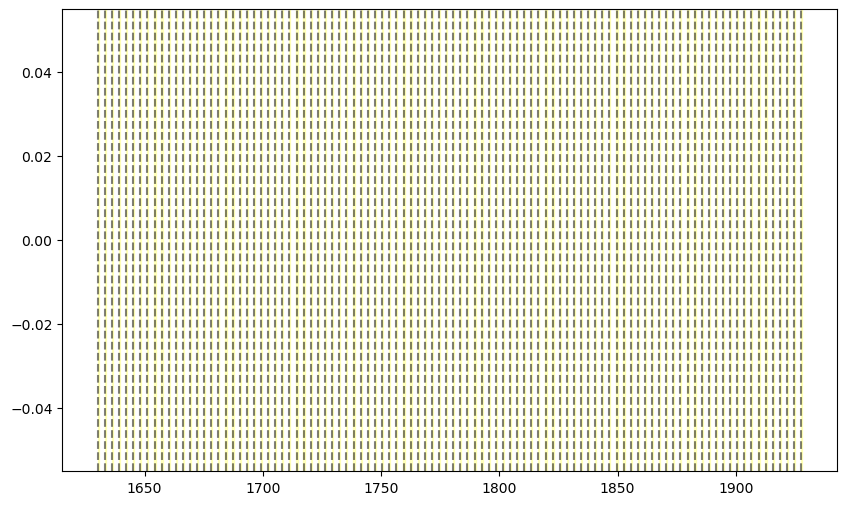

'psth'

In [382]:
plotter.visual_stimuli_duration_psth(otpo_window_range=range(80,85), neuron_range=range(0, 450), extend_plot_time=0.5, all_visual_stimuli=True)

In [353]:
eopn3.trials()

,start_time,stop_time,stimulus,optogenetics_LED_state,flash_luminance,contacts
id,,,,,,
0,1630.086600,1633.091398,luminance_flash,0,0,NaN
1,1633.082600,1636.087398,luminance_flash,0,1,NaN
2,1636.086300,1639.091098,luminance_flash,1,0,NaN
3,1639.088633,1642.093431,luminance_flash,0,1,NaN
4,1642.091526,1645.096324,luminance_flash,0,0,NaN
...,...,...,...,...,...,...
95,1915.549567,1918.554365,luminance_flash,0,1,NaN
96,1918.552900,1921.557698,luminance_flash,1,0,NaN
97,1921.555633,1924.560431,luminance_flash,1,1,NaN


In [354]:
eopn3.optogenetics_states()

,start_time,stop_time,power,wavelength
id,,,,
0,1629.646600,1629.646800,1.5,565
1,1629.647633,1630.297400,1.5,565
2,1636.070300,1636.303033,1.5,565
3,1645.079107,1645.311600,1.5,565
4,1654.086967,1654.319867,1.5,565
5,1657.089800,1657.322767,1.5,565
6,1660.092833,1660.326133,1.5,565
7,1672.103967,1672.337333,1.5,565
8,1675.107058,1675.340100,1.5,565


[3570.826466666667, 3573.8204666666666, 3576.8232333333335, 3579.8258666666666, 3582.828466666667, 3585.8313333333335, 3588.8338, 3591.8371333333334, 3594.84, 3597.8425333333334, 3600.845533333333, 3603.8483333333334, 3606.851133333333, 3609.8541, 3612.8568, 3615.8597666666665, 3618.8627, 3621.8651666666665, 3624.868466666667, 3627.8710333333333, 3630.873866666667, 3633.8768333333333, 3636.8794666666668, 3639.882666666667, 3642.8850666666667, 3645.887833333333, 3648.8912333333333, 3651.8941, 3654.896166666667, 3657.8989333333334, 3660.9023, 3663.9054333333333, 3666.9076, 3669.9108, 3672.914333333333, 3675.9164666666666, 3678.9191333333333, 3681.921966666667, 3684.9249, 3687.927366666667, 3690.930733333333, 3693.9329666666667, 3696.9355666666665, 3699.9390333333336, 3702.9412333333335, 3705.9443666666666, 3708.9475666666667, 3711.9502666666667, 3714.9528666666665, 3717.955466666667, 3720.9601333333335, 3723.9632666666666, 3726.965166666667, 3729.9684333333335, 3732.9709333333335, 3735.9

KeyboardInterrupt: 

<Figure size 1000x600 with 0 Axes>

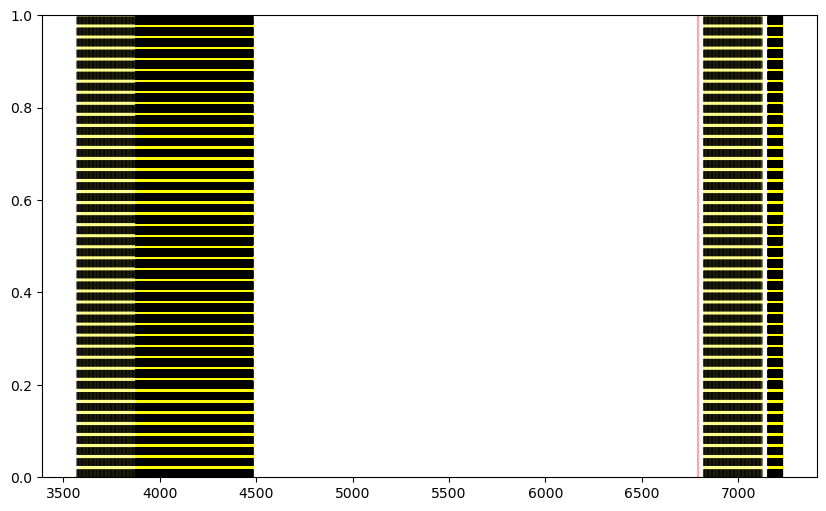

In [8]:
spikes_in_window = plotter.spikes_in_visual_stimuli_window(0,otpo_window_range=range(40,49),neuron_range=None,extend_plot_time=0.5)
print(spikes_in_window)

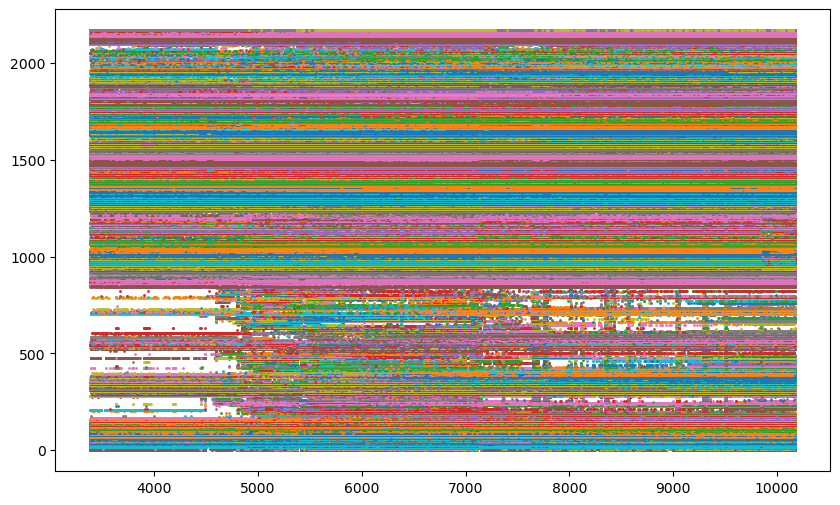

In [9]:
plotter.all_psth()

[1630.0866, 1633.0826, 1636.0863, 1639.0886333333333, 1642.0915264263328, 1645.0951737692171, 1648.0974666666666, 1651.1004666666668, 1654.1024, 1657.1059333333333, 1660.1087666666667, 1663.1107666666667, 1666.1146333333334, 1669.1172, 1672.1202, 1675.1222242758968, 1678.1251666666667, 1681.128, 1684.1310666666666, 1687.1343, 1690.1383666666666, 1693.1401666666666, 1696.1429666666668, 1699.1457666666668, 1702.1485333333333, 1705.1514, 1708.154711207989, 1711.1567666666667, 1714.1594666666667, 1717.1626333333334, 1720.1654666666666, 1723.1686333333334, 1726.1709333333333, 1729.1743333333334, 1732.1759666666667, 1735.1794333333332, 1738.2989, 1741.3184666666666, 1744.3210333333334, 1747.3236333333334, 1750.3271333333332, 1753.3292666666666, 1756.3989666666666, 1759.4017, 1762.4044666666666, 1765.4077333333332, 1768.4106666666667, 1771.4137, 1774.4160333333334, 1777.4193666666667, 1780.4215, 1783.4244, 1786.428, 1789.4310333333333, 1792.4332333333334, 1795.4367168904112, 1798.4404, 1801.4

<Figure size 1000x600 with 0 Axes>

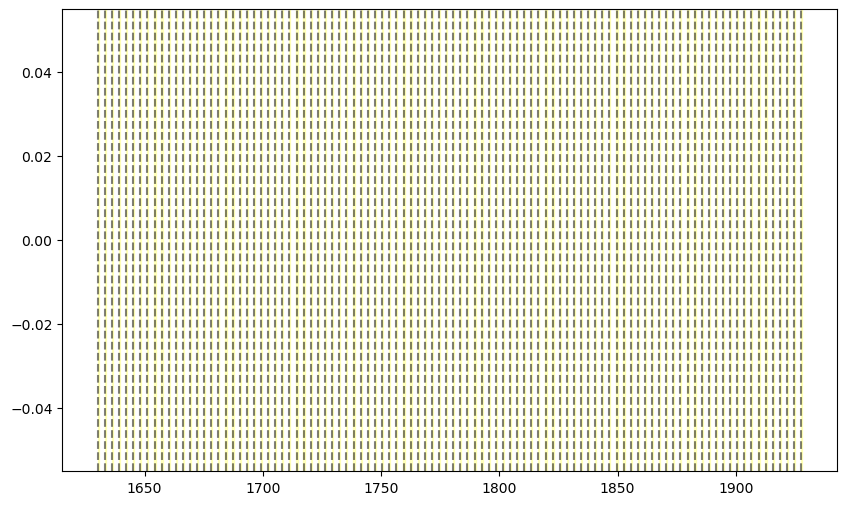

'psth'

In [373]:
plotter.visual_stimuli_duration_psth(otpo_window_range=range(80,85), neuron_range=range(0, 450), extend_plot_time=0.5, all_visual_stimuli=True)

[1630.0866, 1633.0826, 1636.0863, 1639.0886333333333, 1642.0915264263328, 1645.0951737692171, 1648.0974666666666, 1651.1004666666668, 1654.1024, 1657.1059333333333, 1660.1087666666667, 1663.1107666666667, 1666.1146333333334, 1669.1172, 1672.1202, 1675.1222242758968, 1678.1251666666667, 1681.128, 1684.1310666666666, 1687.1343, 1690.1383666666666, 1693.1401666666666, 1696.1429666666668, 1699.1457666666668, 1702.1485333333333, 1705.1514, 1708.154711207989, 1711.1567666666667, 1714.1594666666667, 1717.1626333333334, 1720.1654666666666, 1723.1686333333334, 1726.1709333333333, 1729.1743333333334, 1732.1759666666667, 1735.1794333333332, 1738.2989, 1741.3184666666666, 1744.3210333333334, 1747.3236333333334, 1750.3271333333332, 1753.3292666666666, 1756.3989666666666, 1759.4017, 1762.4044666666666, 1765.4077333333332, 1768.4106666666667, 1771.4137, 1774.4160333333334, 1777.4193666666667, 1780.4215, 1783.4244, 1786.428, 1789.4310333333333, 1792.4332333333334, 1795.4367168904112, 1798.4404, 1801.4

<Figure size 1000x600 with 0 Axes>

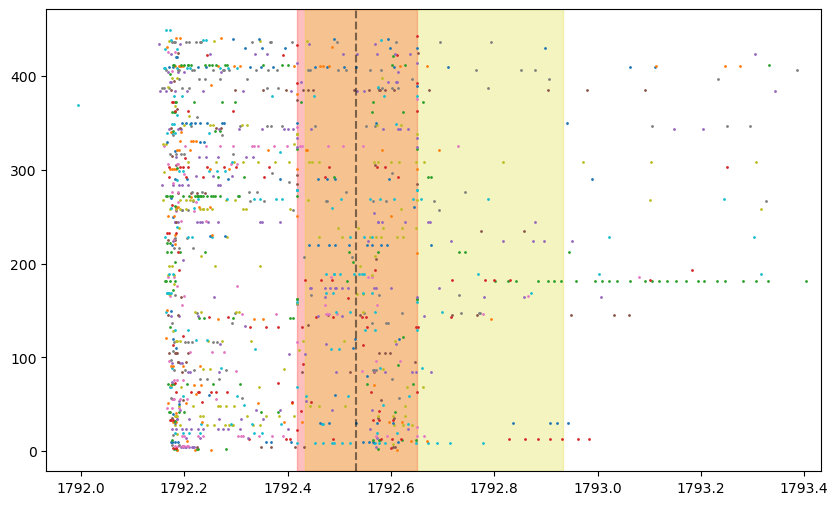

[1630.0866, 1633.0826, 1636.0863, 1639.0886333333333, 1642.0915264263328, 1645.0951737692171, 1648.0974666666666, 1651.1004666666668, 1654.1024, 1657.1059333333333, 1660.1087666666667, 1663.1107666666667, 1666.1146333333334, 1669.1172, 1672.1202, 1675.1222242758968, 1678.1251666666667, 1681.128, 1684.1310666666666, 1687.1343, 1690.1383666666666, 1693.1401666666666, 1696.1429666666668, 1699.1457666666668, 1702.1485333333333, 1705.1514, 1708.154711207989, 1711.1567666666667, 1714.1594666666667, 1717.1626333333334, 1720.1654666666666, 1723.1686333333334, 1726.1709333333333, 1729.1743333333334, 1732.1759666666667, 1735.1794333333332, 1738.2989, 1741.3184666666666, 1744.3210333333334, 1747.3236333333334, 1750.3271333333332, 1753.3292666666666, 1756.3989666666666, 1759.4017, 1762.4044666666666, 1765.4077333333332, 1768.4106666666667, 1771.4137, 1774.4160333333334, 1777.4193666666667, 1780.4215, 1783.4244, 1786.428, 1789.4310333333333, 1792.4332333333334, 1795.4367168904112, 1798.4404, 1801.4

<Figure size 1000x600 with 0 Axes>

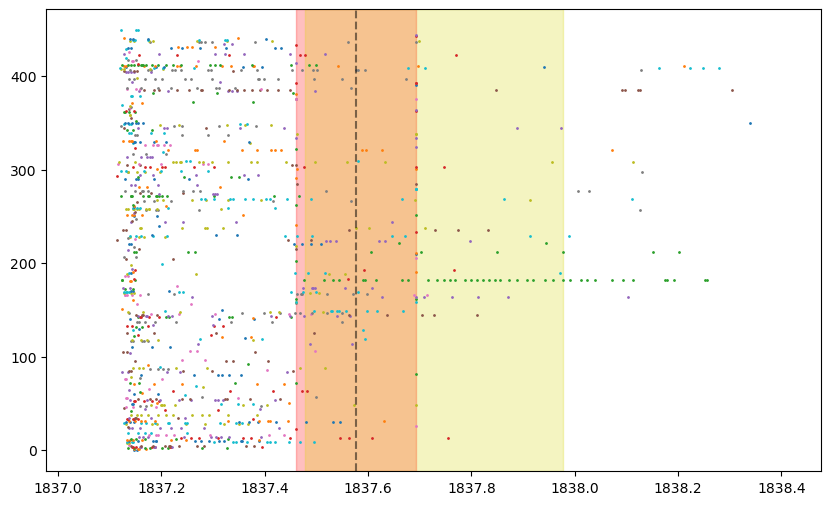

[1630.0866, 1633.0826, 1636.0863, 1639.0886333333333, 1642.0915264263328, 1645.0951737692171, 1648.0974666666666, 1651.1004666666668, 1654.1024, 1657.1059333333333, 1660.1087666666667, 1663.1107666666667, 1666.1146333333334, 1669.1172, 1672.1202, 1675.1222242758968, 1678.1251666666667, 1681.128, 1684.1310666666666, 1687.1343, 1690.1383666666666, 1693.1401666666666, 1696.1429666666668, 1699.1457666666668, 1702.1485333333333, 1705.1514, 1708.154711207989, 1711.1567666666667, 1714.1594666666667, 1717.1626333333334, 1720.1654666666666, 1723.1686333333334, 1726.1709333333333, 1729.1743333333334, 1732.1759666666667, 1735.1794333333332, 1738.2989, 1741.3184666666666, 1744.3210333333334, 1747.3236333333334, 1750.3271333333332, 1753.3292666666666, 1756.3989666666666, 1759.4017, 1762.4044666666666, 1765.4077333333332, 1768.4106666666667, 1771.4137, 1774.4160333333334, 1777.4193666666667, 1780.4215, 1783.4244, 1786.428, 1789.4310333333333, 1792.4332333333334, 1795.4367168904112, 1798.4404, 1801.4

<Figure size 1000x600 with 0 Axes>

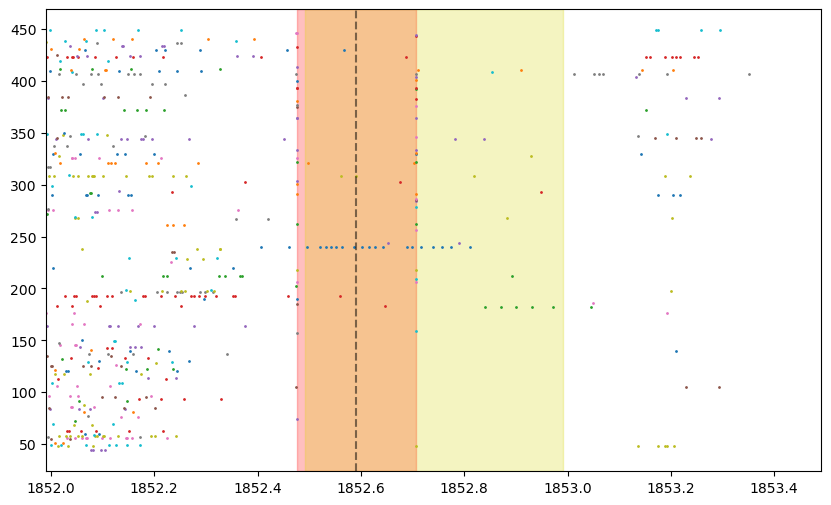

'psth'

In [344]:
plotter.all_visual_stimuli_duration_psth(otpo_window_range=range(27,28), neuron_range=range(0, 450), extend_plot_time=0.5, all_visual_stimuli=True)
plotter.all_visual_stimuli_duration_psth(otpo_window_range=range(34,35), neuron_range=range(0, 450), extend_plot_time=0.5, all_visual_stimuli=True)
plotter.all_visual_stimuli_duration_psth(otpo_window_range=range(37,38), neuron_range=range(0, 450), extend_plot_time=0.5, all_visual_stimuli=True)


[1630.0866, 1633.0826, 1636.0863, 1639.0886333333333, 1642.0915264263328, 1645.0951737692171, 1648.0974666666666, 1651.1004666666668, 1654.1024, 1657.1059333333333, 1660.1087666666667, 1663.1107666666667, 1666.1146333333334, 1669.1172, 1672.1202, 1675.1222242758968, 1678.1251666666667, 1681.128, 1684.1310666666666, 1687.1343, 1690.1383666666666, 1693.1401666666666, 1696.1429666666668, 1699.1457666666668, 1702.1485333333333, 1705.1514, 1708.154711207989, 1711.1567666666667, 1714.1594666666667, 1717.1626333333334, 1720.1654666666666, 1723.1686333333334, 1726.1709333333333, 1729.1743333333334, 1732.1759666666667, 1735.1794333333332, 1738.2989, 1741.3184666666666, 1744.3210333333334, 1747.3236333333334, 1750.3271333333332, 1753.3292666666666, 1756.3989666666666, 1759.4017, 1762.4044666666666, 1765.4077333333332, 1768.4106666666667, 1771.4137, 1774.4160333333334, 1777.4193666666667, 1780.4215, 1783.4244, 1786.428, 1789.4310333333333, 1792.4332333333334, 1795.4367168904112, 1798.4404, 1801.4

<Figure size 1000x600 with 0 Axes>

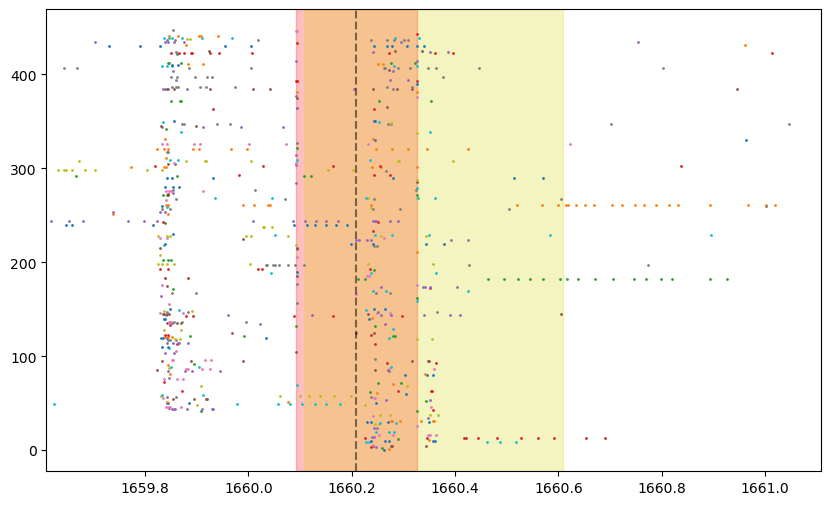

[1630.0866, 1633.0826, 1636.0863, 1639.0886333333333, 1642.0915264263328, 1645.0951737692171, 1648.0974666666666, 1651.1004666666668, 1654.1024, 1657.1059333333333, 1660.1087666666667, 1663.1107666666667, 1666.1146333333334, 1669.1172, 1672.1202, 1675.1222242758968, 1678.1251666666667, 1681.128, 1684.1310666666666, 1687.1343, 1690.1383666666666, 1693.1401666666666, 1696.1429666666668, 1699.1457666666668, 1702.1485333333333, 1705.1514, 1708.154711207989, 1711.1567666666667, 1714.1594666666667, 1717.1626333333334, 1720.1654666666666, 1723.1686333333334, 1726.1709333333333, 1729.1743333333334, 1732.1759666666667, 1735.1794333333332, 1738.2989, 1741.3184666666666, 1744.3210333333334, 1747.3236333333334, 1750.3271333333332, 1753.3292666666666, 1756.3989666666666, 1759.4017, 1762.4044666666666, 1765.4077333333332, 1768.4106666666667, 1771.4137, 1774.4160333333334, 1777.4193666666667, 1780.4215, 1783.4244, 1786.428, 1789.4310333333333, 1792.4332333333334, 1795.4367168904112, 1798.4404, 1801.4

<Figure size 1000x600 with 0 Axes>

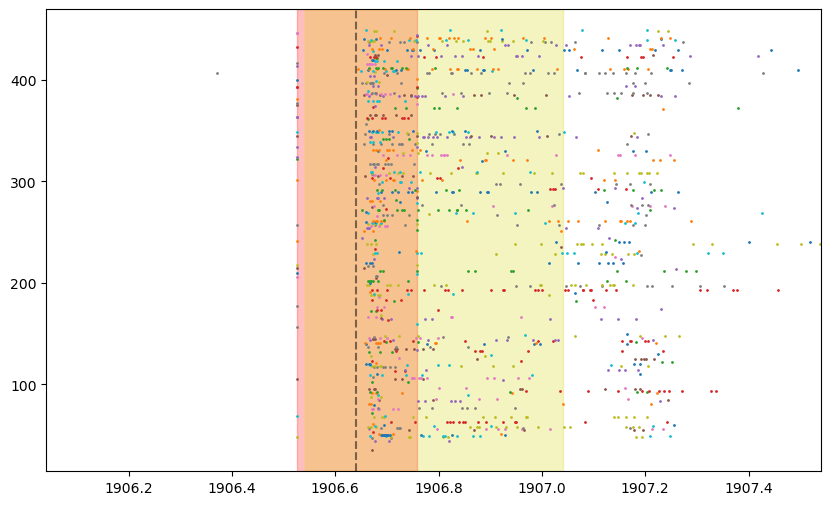

'psth'

In [292]:
plotter.all_visual_stimuli_duration_psth(otpo_window_range=range(4,5), neuron_range=range(0, 450), extend_plot_time=0.5, all_visual_stimuli=True)
plotter.all_visual_stimuli_duration_psth(otpo_window_range=range(45,46), neuron_range=range(0, 450), extend_plot_time=0.5, all_visual_stimuli=True)


[1630.0866, 1633.0826, 1636.0863, 1639.0886333333333, 1642.0915264263328, 1645.0951737692171, 1648.0974666666666, 1651.1004666666668, 1654.1024, 1657.1059333333333, 1660.1087666666667, 1663.1107666666667, 1666.1146333333334, 1669.1172, 1672.1202, 1675.1222242758968, 1678.1251666666667, 1681.128, 1684.1310666666666, 1687.1343, 1690.1383666666666, 1693.1401666666666, 1696.1429666666668, 1699.1457666666668, 1702.1485333333333, 1705.1514, 1708.154711207989, 1711.1567666666667, 1714.1594666666667, 1717.1626333333334, 1720.1654666666666, 1723.1686333333334, 1726.1709333333333, 1729.1743333333334, 1732.1759666666667, 1735.1794333333332, 1738.2989, 1741.3184666666666, 1744.3210333333334, 1747.3236333333334, 1750.3271333333332, 1753.3292666666666, 1756.3989666666666, 1759.4017, 1762.4044666666666, 1765.4077333333332, 1768.4106666666667, 1771.4137, 1774.4160333333334, 1777.4193666666667, 1780.4215, 1783.4244, 1786.428, 1789.4310333333333, 1792.4332333333334, 1795.4367168904112, 1798.4404, 1801.4

<Figure size 1000x600 with 0 Axes>

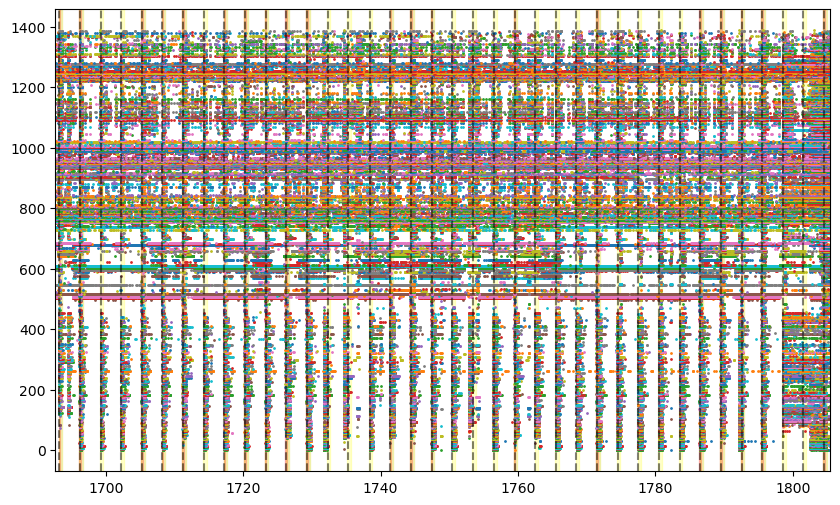

'Optogentic on'

In [255]:
plotter.all_visual_stimuli_duration_psth(otpo_window_range=range(43, 45), neuron_range=range(0, 450), extend_plot_time=1, all_visual_stimuli=True)


[1630.0866, 1633.0826, 1636.0863, 1639.0886333333333, 1642.0915264263328, 1645.0951737692171, 1648.0974666666666, 1651.1004666666668, 1654.1024, 1657.1059333333333, 1660.1087666666667, 1663.1107666666667, 1666.1146333333334, 1669.1172, 1672.1202, 1675.1222242758968, 1678.1251666666667, 1681.128, 1684.1310666666666, 1687.1343, 1690.1383666666666, 1693.1401666666666, 1696.1429666666668, 1699.1457666666668, 1702.1485333333333, 1705.1514, 1708.154711207989, 1711.1567666666667, 1714.1594666666667, 1717.1626333333334, 1720.1654666666666, 1723.1686333333334, 1726.1709333333333, 1729.1743333333334, 1732.1759666666667, 1735.1794333333332, 1738.2989, 1741.3184666666666, 1744.3210333333334, 1747.3236333333334, 1750.3271333333332, 1753.3292666666666, 1756.3989666666666, 1759.4017, 1762.4044666666666, 1765.4077333333332, 1768.4106666666667, 1771.4137, 1774.4160333333334, 1777.4193666666667, 1780.4215, 1783.4244, 1786.428, 1789.4310333333333, 1792.4332333333334, 1795.4367168904112, 1798.4404, 1801.4

<Figure size 1000x600 with 0 Axes>

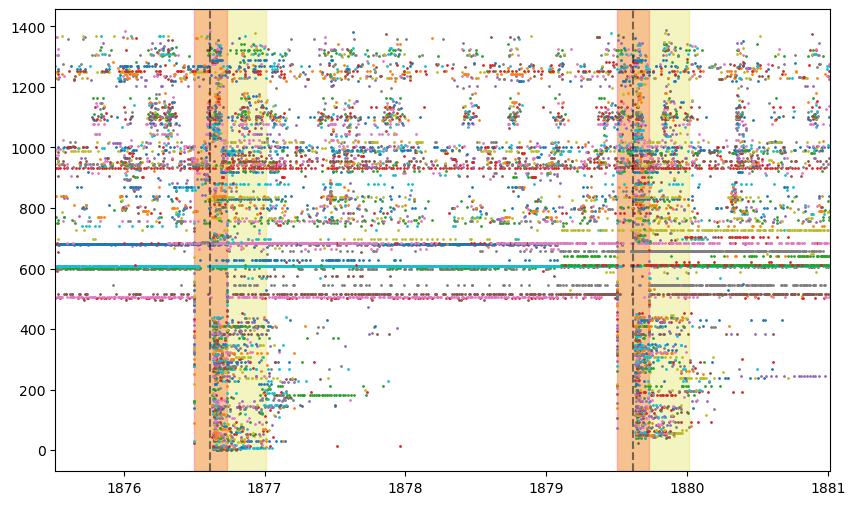

'Optogentic on'

In [264]:
plotter.all_visual_stimuli_duration_psth(range(40,42),True,1)


[1630.0866, 1633.0826, 1636.0863, 1639.0886333333333, 1642.0915264263328, 1645.0951737692171, 1648.0974666666666, 1651.1004666666668, 1654.1024, 1657.1059333333333, 1660.1087666666667, 1663.1107666666667, 1666.1146333333334, 1669.1172, 1672.1202, 1675.1222242758968, 1678.1251666666667, 1681.128, 1684.1310666666666, 1687.1343, 1690.1383666666666, 1693.1401666666666, 1696.1429666666668, 1699.1457666666668, 1702.1485333333333, 1705.1514, 1708.154711207989, 1711.1567666666667, 1714.1594666666667, 1717.1626333333334, 1720.1654666666666, 1723.1686333333334, 1726.1709333333333, 1729.1743333333334, 1732.1759666666667, 1735.1794333333332, 1738.2989, 1741.3184666666666, 1744.3210333333334, 1747.3236333333334, 1750.3271333333332, 1753.3292666666666, 1756.3989666666666, 1759.4017, 1762.4044666666666, 1765.4077333333332, 1768.4106666666667, 1771.4137, 1774.4160333333334, 1777.4193666666667, 1780.4215, 1783.4244, 1786.428, 1789.4310333333333, 1792.4332333333334, 1795.4367168904112, 1798.4404, 1801.4

<Figure size 1000x600 with 0 Axes>

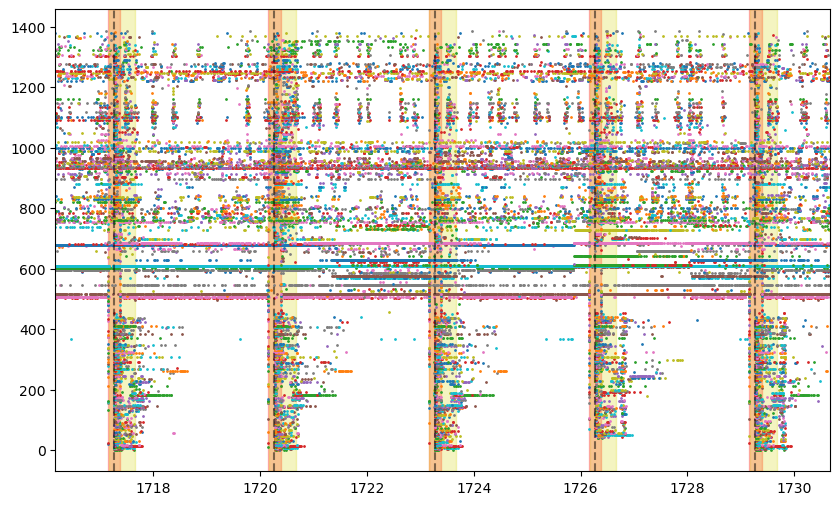

'Optogentic on'

In [263]:
plotter.all_visual_stimuli_duration_psth(range(15,20),True,1)


[1630.0866, 1633.0826, 1636.0863, 1639.0886333333333, 1642.0915264263328, 1645.0951737692171, 1648.0974666666666, 1651.1004666666668, 1654.1024, 1657.1059333333333, 1660.1087666666667, 1663.1107666666667, 1666.1146333333334, 1669.1172, 1672.1202, 1675.1222242758968, 1678.1251666666667, 1681.128, 1684.1310666666666, 1687.1343, 1690.1383666666666, 1693.1401666666666, 1696.1429666666668, 1699.1457666666668, 1702.1485333333333, 1705.1514, 1708.154711207989, 1711.1567666666667, 1714.1594666666667, 1717.1626333333334, 1720.1654666666666, 1723.1686333333334, 1726.1709333333333, 1729.1743333333334, 1732.1759666666667, 1735.1794333333332, 1738.2989, 1741.3184666666666, 1744.3210333333334, 1747.3236333333334, 1750.3271333333332, 1753.3292666666666, 1756.3989666666666, 1759.4017, 1762.4044666666666, 1765.4077333333332, 1768.4106666666667, 1771.4137, 1774.4160333333334, 1777.4193666666667, 1780.4215, 1783.4244, 1786.428, 1789.4310333333333, 1792.4332333333334, 1795.4367168904112, 1798.4404, 1801.4

<Figure size 1000x600 with 0 Axes>

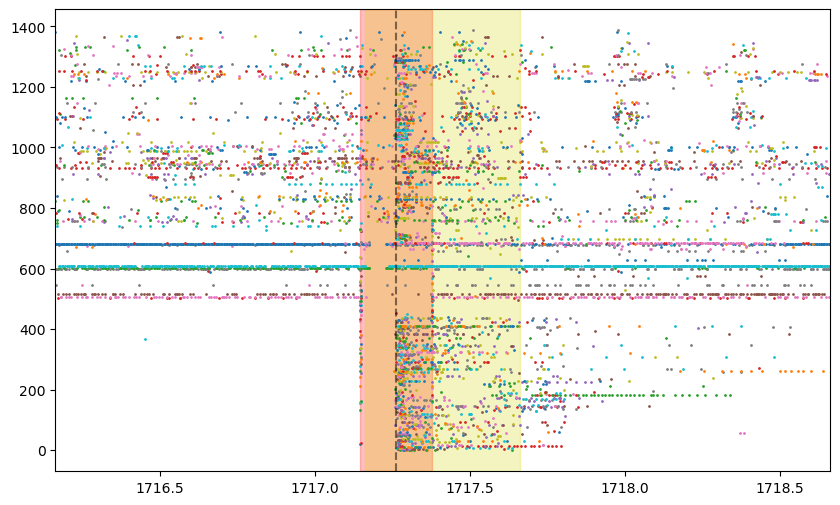

[1630.0866, 1633.0826, 1636.0863, 1639.0886333333333, 1642.0915264263328, 1645.0951737692171, 1648.0974666666666, 1651.1004666666668, 1654.1024, 1657.1059333333333, 1660.1087666666667, 1663.1107666666667, 1666.1146333333334, 1669.1172, 1672.1202, 1675.1222242758968, 1678.1251666666667, 1681.128, 1684.1310666666666, 1687.1343, 1690.1383666666666, 1693.1401666666666, 1696.1429666666668, 1699.1457666666668, 1702.1485333333333, 1705.1514, 1708.154711207989, 1711.1567666666667, 1714.1594666666667, 1717.1626333333334, 1720.1654666666666, 1723.1686333333334, 1726.1709333333333, 1729.1743333333334, 1732.1759666666667, 1735.1794333333332, 1738.2989, 1741.3184666666666, 1744.3210333333334, 1747.3236333333334, 1750.3271333333332, 1753.3292666666666, 1756.3989666666666, 1759.4017, 1762.4044666666666, 1765.4077333333332, 1768.4106666666667, 1771.4137, 1774.4160333333334, 1777.4193666666667, 1780.4215, 1783.4244, 1786.428, 1789.4310333333333, 1792.4332333333334, 1795.4367168904112, 1798.4404, 1801.4

<Figure size 1000x600 with 0 Axes>

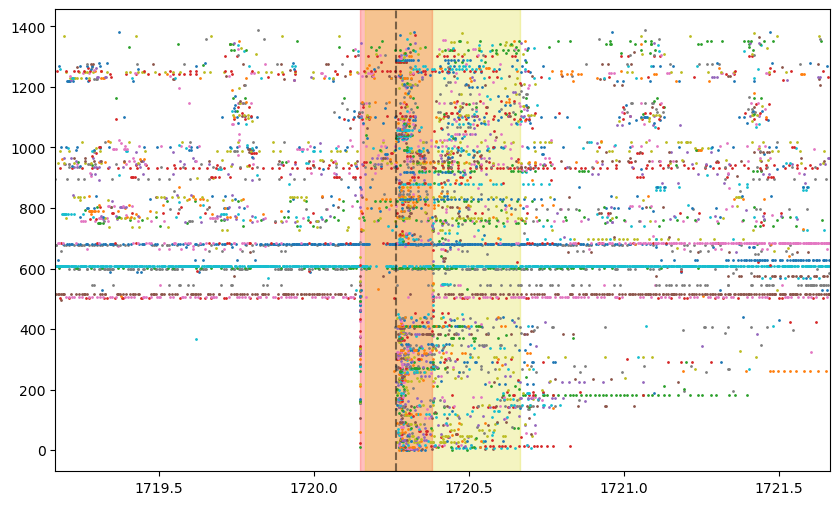

[1630.0866, 1633.0826, 1636.0863, 1639.0886333333333, 1642.0915264263328, 1645.0951737692171, 1648.0974666666666, 1651.1004666666668, 1654.1024, 1657.1059333333333, 1660.1087666666667, 1663.1107666666667, 1666.1146333333334, 1669.1172, 1672.1202, 1675.1222242758968, 1678.1251666666667, 1681.128, 1684.1310666666666, 1687.1343, 1690.1383666666666, 1693.1401666666666, 1696.1429666666668, 1699.1457666666668, 1702.1485333333333, 1705.1514, 1708.154711207989, 1711.1567666666667, 1714.1594666666667, 1717.1626333333334, 1720.1654666666666, 1723.1686333333334, 1726.1709333333333, 1729.1743333333334, 1732.1759666666667, 1735.1794333333332, 1738.2989, 1741.3184666666666, 1744.3210333333334, 1747.3236333333334, 1750.3271333333332, 1753.3292666666666, 1756.3989666666666, 1759.4017, 1762.4044666666666, 1765.4077333333332, 1768.4106666666667, 1771.4137, 1774.4160333333334, 1777.4193666666667, 1780.4215, 1783.4244, 1786.428, 1789.4310333333333, 1792.4332333333334, 1795.4367168904112, 1798.4404, 1801.4

<Figure size 1000x600 with 0 Axes>

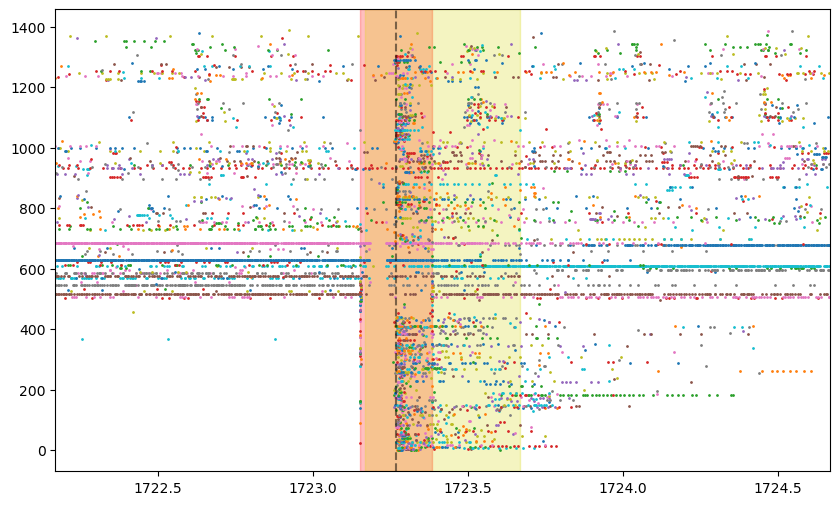

[1630.0866, 1633.0826, 1636.0863, 1639.0886333333333, 1642.0915264263328, 1645.0951737692171, 1648.0974666666666, 1651.1004666666668, 1654.1024, 1657.1059333333333, 1660.1087666666667, 1663.1107666666667, 1666.1146333333334, 1669.1172, 1672.1202, 1675.1222242758968, 1678.1251666666667, 1681.128, 1684.1310666666666, 1687.1343, 1690.1383666666666, 1693.1401666666666, 1696.1429666666668, 1699.1457666666668, 1702.1485333333333, 1705.1514, 1708.154711207989, 1711.1567666666667, 1714.1594666666667, 1717.1626333333334, 1720.1654666666666, 1723.1686333333334, 1726.1709333333333, 1729.1743333333334, 1732.1759666666667, 1735.1794333333332, 1738.2989, 1741.3184666666666, 1744.3210333333334, 1747.3236333333334, 1750.3271333333332, 1753.3292666666666, 1756.3989666666666, 1759.4017, 1762.4044666666666, 1765.4077333333332, 1768.4106666666667, 1771.4137, 1774.4160333333334, 1777.4193666666667, 1780.4215, 1783.4244, 1786.428, 1789.4310333333333, 1792.4332333333334, 1795.4367168904112, 1798.4404, 1801.4

<Figure size 1000x600 with 0 Axes>

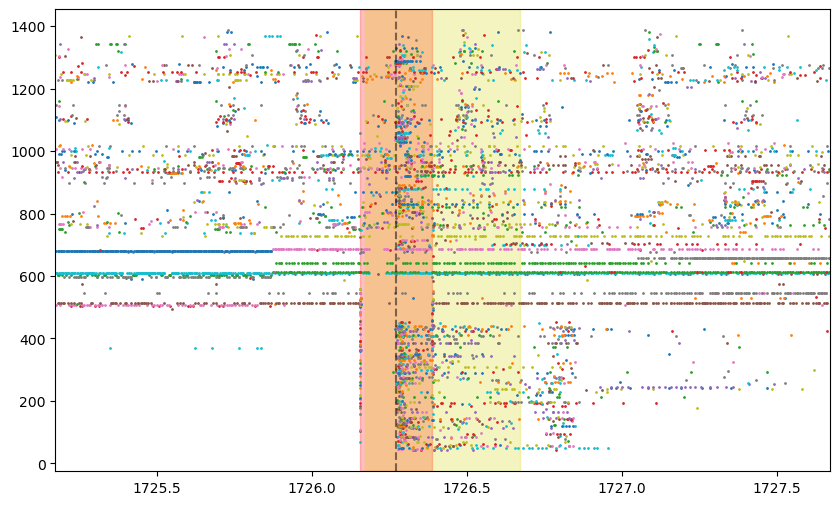

[1630.0866, 1633.0826, 1636.0863, 1639.0886333333333, 1642.0915264263328, 1645.0951737692171, 1648.0974666666666, 1651.1004666666668, 1654.1024, 1657.1059333333333, 1660.1087666666667, 1663.1107666666667, 1666.1146333333334, 1669.1172, 1672.1202, 1675.1222242758968, 1678.1251666666667, 1681.128, 1684.1310666666666, 1687.1343, 1690.1383666666666, 1693.1401666666666, 1696.1429666666668, 1699.1457666666668, 1702.1485333333333, 1705.1514, 1708.154711207989, 1711.1567666666667, 1714.1594666666667, 1717.1626333333334, 1720.1654666666666, 1723.1686333333334, 1726.1709333333333, 1729.1743333333334, 1732.1759666666667, 1735.1794333333332, 1738.2989, 1741.3184666666666, 1744.3210333333334, 1747.3236333333334, 1750.3271333333332, 1753.3292666666666, 1756.3989666666666, 1759.4017, 1762.4044666666666, 1765.4077333333332, 1768.4106666666667, 1771.4137, 1774.4160333333334, 1777.4193666666667, 1780.4215, 1783.4244, 1786.428, 1789.4310333333333, 1792.4332333333334, 1795.4367168904112, 1798.4404, 1801.4

<Figure size 1000x600 with 0 Axes>

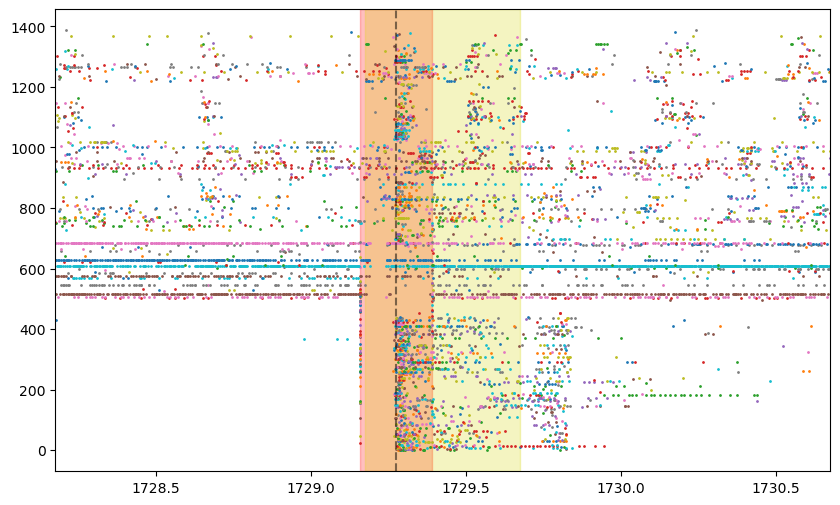

'Optogentic on'

In [262]:
plotter.all_visual_stimuli_duration_psth(range(15,16),True,1)
plotter.all_visual_stimuli_duration_psth(range(16,17),True,1)
plotter.all_visual_stimuli_duration_psth(range(17,18),True,1)
plotter.all_visual_stimuli_duration_psth(range(18,19),True,1)
plotter.all_visual_stimuli_duration_psth(range(19,20),True,1)


[1630.0866, 1633.0826, 1636.0863, 1639.0886333333333, 1642.0915264263328, 1645.0951737692171, 1648.0974666666666, 1651.1004666666668, 1654.1024, 1657.1059333333333, 1660.1087666666667, 1663.1107666666667, 1666.1146333333334, 1669.1172, 1672.1202, 1675.1222242758968, 1678.1251666666667, 1681.128, 1684.1310666666666, 1687.1343, 1690.1383666666666, 1693.1401666666666, 1696.1429666666668, 1699.1457666666668, 1702.1485333333333, 1705.1514, 1708.154711207989, 1711.1567666666667, 1714.1594666666667, 1717.1626333333334, 1720.1654666666666, 1723.1686333333334, 1726.1709333333333, 1729.1743333333334, 1732.1759666666667, 1735.1794333333332, 1738.2989, 1741.3184666666666, 1744.3210333333334, 1747.3236333333334, 1750.3271333333332, 1753.3292666666666, 1756.3989666666666, 1759.4017, 1762.4044666666666, 1765.4077333333332, 1768.4106666666667, 1771.4137, 1774.4160333333334, 1777.4193666666667, 1780.4215, 1783.4244, 1786.428, 1789.4310333333333, 1792.4332333333334, 1795.4367168904112, 1798.4404, 1801.4

<Figure size 1000x600 with 0 Axes>

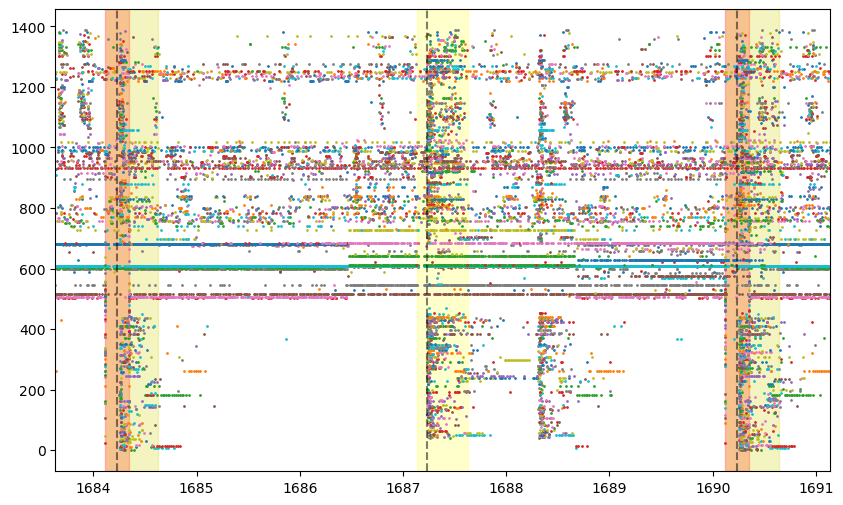

'Optogentic on'

In [256]:
plotter.all_visual_stimuli_duration_psth(range(8,10),True,0.5)


[1630.0866, 1633.0826, 1636.0863, 1639.0886333333333, 1642.0915264263328, 1645.0951737692171, 1648.0974666666666, 1651.1004666666668, 1654.1024, 1657.1059333333333, 1660.1087666666667, 1663.1107666666667, 1666.1146333333334, 1669.1172, 1672.1202, 1675.1222242758968, 1678.1251666666667, 1681.128, 1684.1310666666666, 1687.1343, 1690.1383666666666, 1693.1401666666666, 1696.1429666666668, 1699.1457666666668, 1702.1485333333333, 1705.1514, 1708.154711207989, 1711.1567666666667, 1714.1594666666667, 1717.1626333333334, 1720.1654666666666, 1723.1686333333334, 1726.1709333333333, 1729.1743333333334, 1732.1759666666667, 1735.1794333333332, 1738.2989, 1741.3184666666666, 1744.3210333333334, 1747.3236333333334, 1750.3271333333332, 1753.3292666666666, 1756.3989666666666, 1759.4017, 1762.4044666666666, 1765.4077333333332, 1768.4106666666667, 1771.4137, 1774.4160333333334, 1777.4193666666667, 1780.4215, 1783.4244, 1786.428, 1789.4310333333333, 1792.4332333333334, 1795.4367168904112, 1798.4404, 1801.4

<Figure size 1000x600 with 0 Axes>

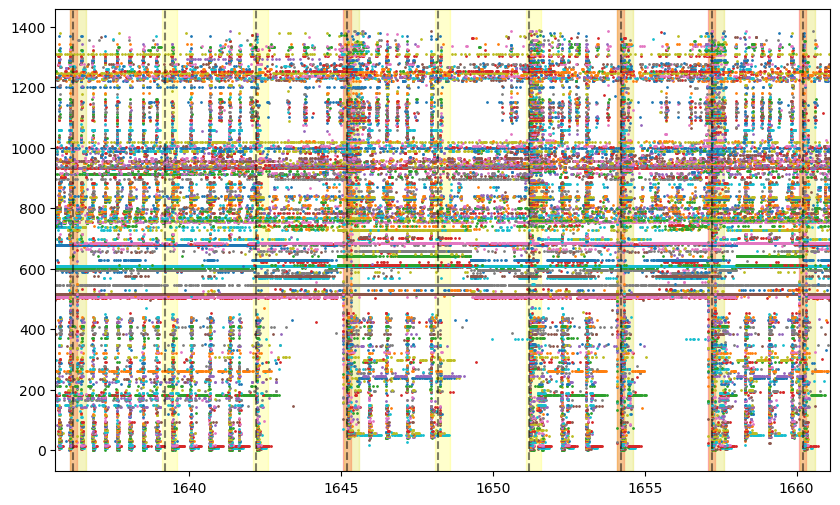

'Optogentic on'

In [258]:
plotter.all_visual_stimuli_duration_psth(range(0,5),True,0.5)


[1630.0866, 1633.0826, 1636.0863, 1639.0886333333333, 1642.0915264263328, 1645.0951737692171, 1648.0974666666666, 1651.1004666666668, 1654.1024, 1657.1059333333333, 1660.1087666666667, 1663.1107666666667, 1666.1146333333334, 1669.1172, 1672.1202, 1675.1222242758968, 1678.1251666666667, 1681.128, 1684.1310666666666, 1687.1343, 1690.1383666666666, 1693.1401666666666, 1696.1429666666668, 1699.1457666666668, 1702.1485333333333, 1705.1514, 1708.154711207989, 1711.1567666666667, 1714.1594666666667, 1717.1626333333334, 1720.1654666666666, 1723.1686333333334, 1726.1709333333333, 1729.1743333333334, 1732.1759666666667, 1735.1794333333332, 1738.2989, 1741.3184666666666, 1744.3210333333334, 1747.3236333333334, 1750.3271333333332, 1753.3292666666666, 1756.3989666666666, 1759.4017, 1762.4044666666666, 1765.4077333333332, 1768.4106666666667, 1771.4137, 1774.4160333333334, 1777.4193666666667, 1780.4215, 1783.4244, 1786.428, 1789.4310333333333, 1792.4332333333334, 1795.4367168904112, 1798.4404, 1801.4

<Figure size 1000x600 with 0 Axes>

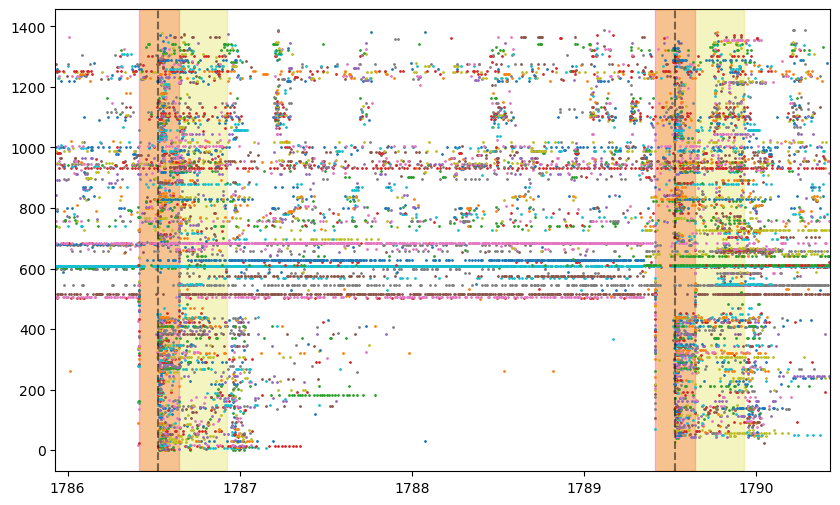

[1630.0866, 1633.0826, 1636.0863, 1639.0886333333333, 1642.0915264263328, 1645.0951737692171, 1648.0974666666666, 1651.1004666666668, 1654.1024, 1657.1059333333333, 1660.1087666666667, 1663.1107666666667, 1666.1146333333334, 1669.1172, 1672.1202, 1675.1222242758968, 1678.1251666666667, 1681.128, 1684.1310666666666, 1687.1343, 1690.1383666666666, 1693.1401666666666, 1696.1429666666668, 1699.1457666666668, 1702.1485333333333, 1705.1514, 1708.154711207989, 1711.1567666666667, 1714.1594666666667, 1717.1626333333334, 1720.1654666666666, 1723.1686333333334, 1726.1709333333333, 1729.1743333333334, 1732.1759666666667, 1735.1794333333332, 1738.2989, 1741.3184666666666, 1744.3210333333334, 1747.3236333333334, 1750.3271333333332, 1753.3292666666666, 1756.3989666666666, 1759.4017, 1762.4044666666666, 1765.4077333333332, 1768.4106666666667, 1771.4137, 1774.4160333333334, 1777.4193666666667, 1780.4215, 1783.4244, 1786.428, 1789.4310333333333, 1792.4332333333334, 1795.4367168904112, 1798.4404, 1801.4

<Figure size 1000x600 with 0 Axes>

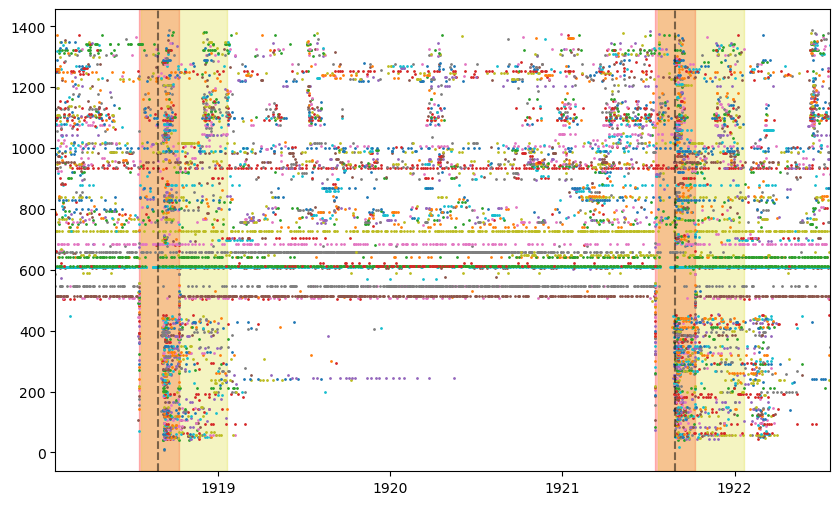

'Optogentic on'

In [257]:
plotter.all_visual_stimuli_duration_psth(range(25,27),True,0.5)
plotter.all_visual_stimuli_duration_psth(range(46,48),True,0.5)

# General Recording Data

In [154]:
meta_data = eopn3.view_nwb()
optogenetics_states = eopn3.optogenetics_states()
epochs = eopn3.epochs()
trails_df = eopn3.trials()
units_df = eopn3.units()


root pynwb.file.NWBFile at 0x140585184179632
Fields:
  devices: {
    DenmanLab_EphysRig1 <class 'pynwb.device.Device'>
  }
  electrode_groups: {
    probe0 <class 'pynwb.ecephys.ElectrodeGroup'>,
    probe1 <class 'pynwb.ecephys.ElectrodeGroup'>
  }
  electrodes: electrodes <class 'hdmf.common.table.DynamicTable'>
  epochs: epochs <class 'pynwb.epoch.TimeIntervals'>
  experiment_description: Denman Lab, University of Colorado Anschutz. Test of eOPN3 axon silencing in V1
  experimenter: ['DJD_IJH']
  file_create_date: [datetime.datetime(2023, 8, 9, 11, 48, 14, 549569, tzinfo=tzoffset(None, -21600))]
  identifier: /Volumes/s2/V1_LM/eOPN3_043/2023-08-04_09-37-18_eOPN3_043/
  institution: University of Colorado
  intervals: {
    epochs <class 'pynwb.epoch.TimeIntervals'>,
    optogenetics_states <class 'pynwb.epoch.TimeIntervals'>,
    trials <class 'pynwb.epoch.TimeIntervals'>
  }
  lab: Denman Lab
  session_description: Axon silencing with eOPN3: eOPN3_00
  session_start_time: 2023-08-

In [76]:
trails_df.head(-1)


,start_time,stop_time,stimulus,optogenetics_LED_state,flash_luminance,contacts
id,,,,,,
0,1630.086600,1633.091398,luminance_flash,0,0,NaN
1,1633.082600,1636.087398,luminance_flash,0,1,NaN
2,1636.086300,1639.091098,luminance_flash,1,0,NaN
3,1639.088633,1642.093431,luminance_flash,0,1,NaN
4,1642.091526,1645.096324,luminance_flash,0,0,NaN
...,...,...,...,...,...,...
94,1912.547633,1915.552431,luminance_flash,0,0,NaN
95,1915.549567,1918.554365,luminance_flash,0,1,NaN
96,1918.552900,1921.557698,luminance_flash,1,0,NaN


In [77]:
optogenetics_states.head(10)

,start_time,stop_time,power,wavelength
id,,,,
0,1629.646600,1629.646800,1.5,565
1,1629.647633,1630.297400,1.5,565
2,1636.070300,1636.303033,1.5,565
3,1645.079107,1645.311600,1.5,565
4,1654.086967,1654.319867,1.5,565
5,1657.089800,1657.322767,1.5,565
6,1660.092833,1660.326133,1.5,565
7,1672.103967,1672.337333,1.5,565
8,1675.107058,1675.340100,1.5,565


In [155]:
units_df.head()


,depth,xpos,ypos,label,KSlabel,KSamplitude,KScontamination,probe,spike_times,electrodes,waveform_mean
id,,,,,,,,,,,
0,1013.195409,30.683947,3795.195409,0,1,1016.1,100.2,A,"[1109.4048936263537, 1109.818320648671, 1110.2...",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,938.338041,31.053864,3720.338041,0,1,883.9,80.4,A,"[1108.9367264189364, 1108.938428117146, 1110.3...",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,983.547308,27.801565,3765.547308,0,1,513.9,43.3,A,"[1107.0035413375556, 1107.0217915700377, 1107....",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
3,925.189943,29.911659,3707.189943,0,1,922.2,244.3,A,"[1104.5537168053509, 1106.3120356802092, 1107....",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,973.527915,33.743584,3755.527915,2,2,1129.2,7.4,A,"[1107.0476822106343, 1108.0015932361373, 1108....",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


In [84]:
duration = structure_data.optogenetics_on_duration()
print(len(duration))
duration

52


[[1629.6466, 1629.6468],
 [1629.6476333333333, 1630.2974],
 [1636.0703, 1636.3030333333334],
 [1645.0791071015044, 1645.3116],
 [1654.0869666666667, 1654.3198666666667],
 [1657.0898, 1657.3227666666667],
 [1660.0928333333334, 1660.3261333333332],
 [1672.1039666666666, 1672.3373333333334],
 [1675.1070576102177, 1675.3401],
 [1681.1122333333333, 1681.3455666666666],
 [1684.1148, 1684.3484],
 [1690.1202, 1690.3546],
 [1693.1238, 1693.3568666666667],
 [1696.1265333333333, 1696.3598228932408],
 [1705.1358, 1705.3681666666666],
 [1708.1380778735727, 1708.3713666666667],
 [1711.1409, 1711.3739],
 [1717.1471666666666, 1717.3788],
 [1720.1493333333333, 1720.3824],
 [1723.1530333333333, 1723.3850666666667],
 [1726.1551, 1726.3879],
 [1729.158, 1729.3908540761163],
 [1741.3026, 1741.5347666666667],
 [1744.3047666666666, 1744.5384666666666],
 [1747.3074, 1747.5422333333333],
 [1759.3855666666666, 1759.6186666666667],
 [1771.3977, 1771.6306666666667],
 [1786.4119333333333, 1786.6449666666667],
 [17

In [83]:
optogenetics_on_windows= structure_data.optogenetics_on_windows()
print(len(optogenetics_on_windows))
optogenetics_on_windows

50


[[1636.0863, 1639.091097979798],
 [1645.0951737692171, 1648.0999717490151],
 [1654.1024, 1657.107197979798],
 [1657.1059333333333, 1660.1107313131313],
 [1660.1087666666667, 1663.1135646464647],
 [1672.1202, 1675.124997979798],
 [1675.1222242758968, 1678.1270222556948],
 [1681.128, 1684.132797979798],
 [1684.1310666666666, 1687.1358646464646],
 [1690.1383666666666, 1693.1431646464646],
 [1693.1401666666666, 1696.1449646464646],
 [1696.1429666666668, 1699.1477646464648],
 [1705.1514, 1708.156197979798],
 [1708.154711207989, 1711.159509187787],
 [1711.1567666666667, 1714.1615646464647],
 [1717.1626333333334, 1720.1674313131314],
 [1720.1654666666666, 1723.1702646464646],
 [1723.1686333333334, 1726.1734313131315],
 [1726.1709333333333, 1729.1757313131313],
 [1729.1743333333334, 1732.1791313131314],
 [1741.3184666666666, 1744.3232646464646],
 [1744.3210333333334, 1747.3258313131314],
 [1747.3236333333334, 1750.3284313131314],
 [1759.4017, 1762.406497979798],
 [1771.4137, 1774.418497979798]

In [73]:
trail_window[0]

[1636.0863, 1639.091097979798]

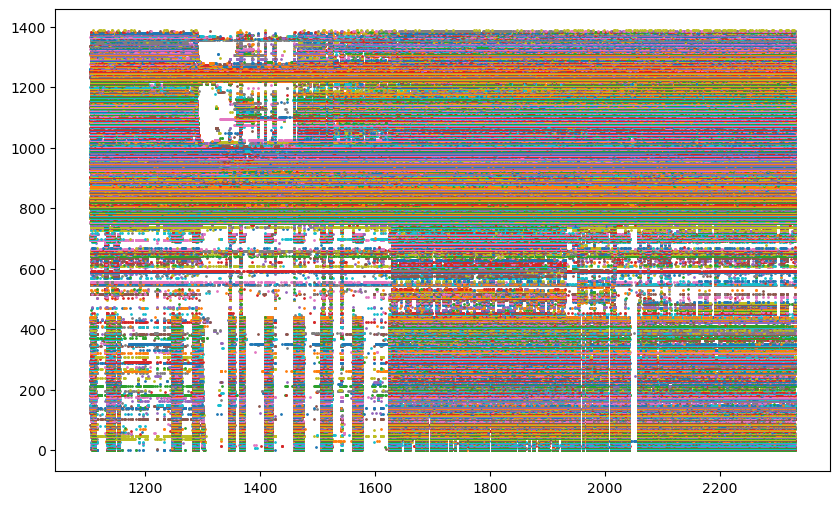

In [37]:
plotter.all_psth()

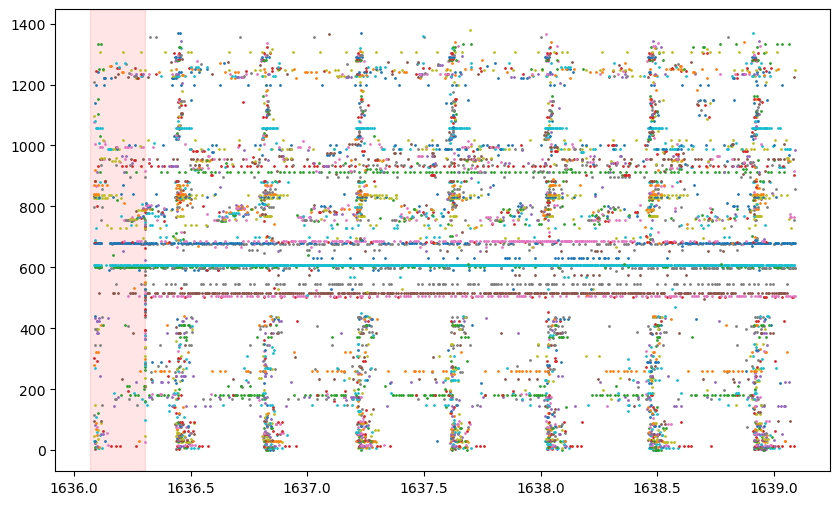

'Optogentic on'

In [93]:
plotter.optogenetic_on_psth(0)

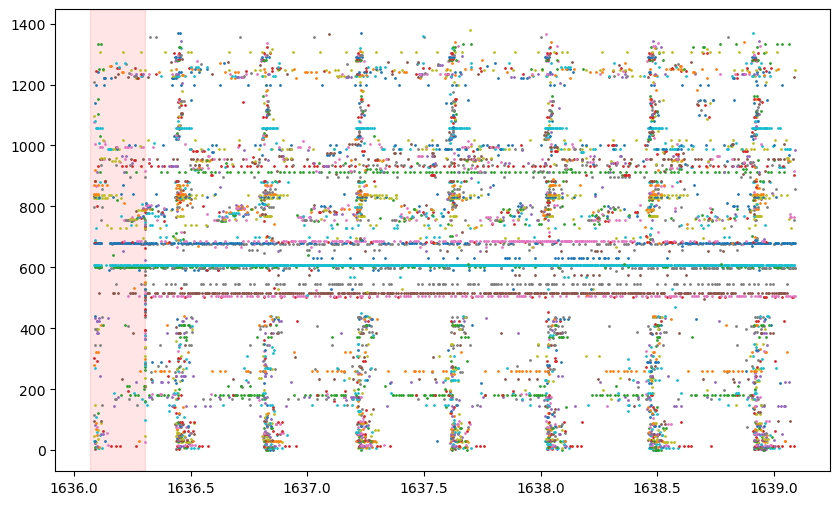

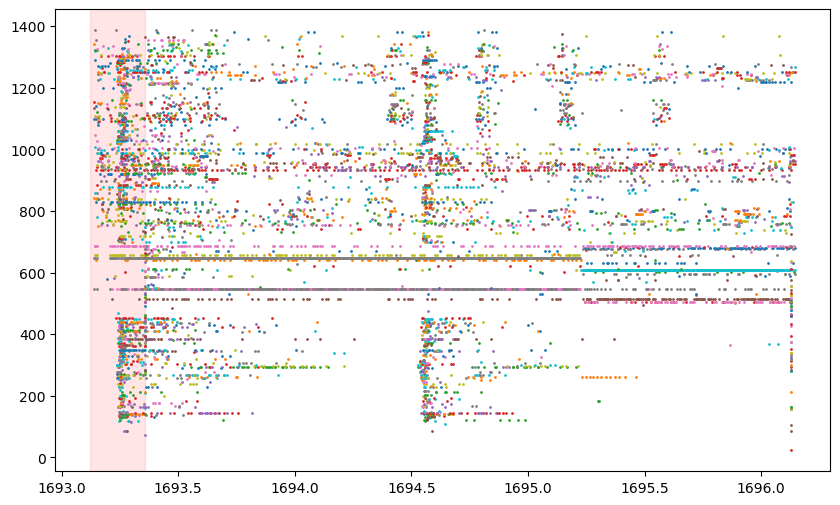

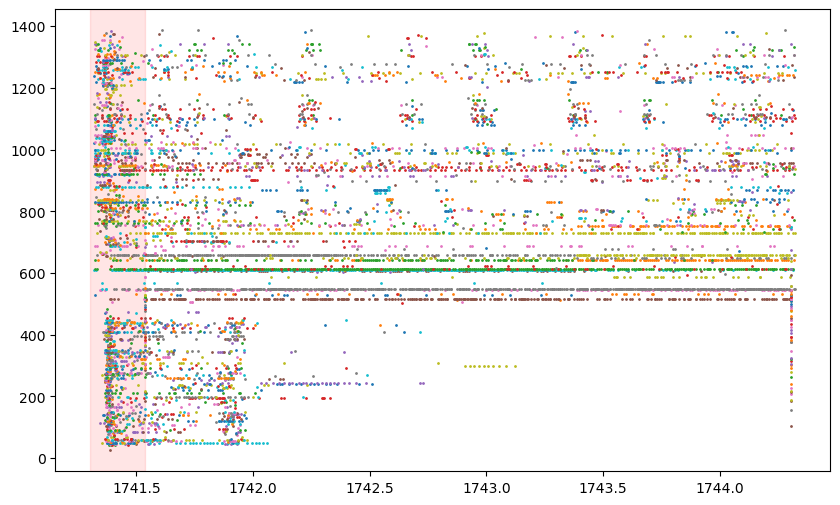

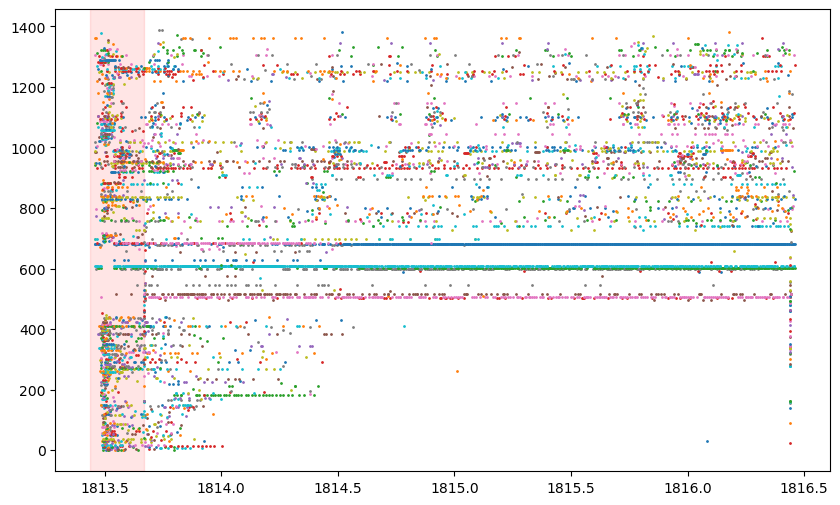

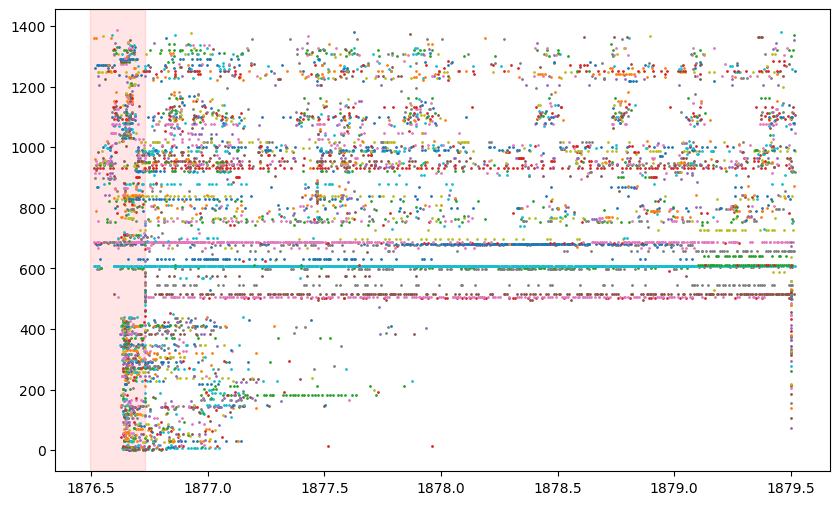

'Optogentic on'

In [94]:
plotter.optogenetic_on_psth(0)
plotter.optogenetic_on_psth(10)
plotter.optogenetic_on_psth(20)
plotter.optogenetic_on_psth(30)
plotter.optogenetic_on_psth(40)


1915.5495666666666 1918.5543646464646


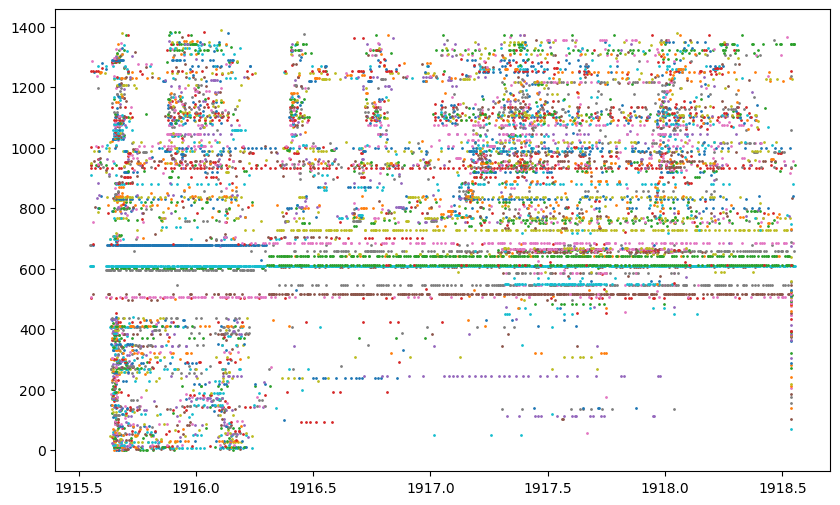

'Optogentic off'

In [39]:
plotter.optogenetic_off_psth(-1)

1633.0826 1636.087397979798


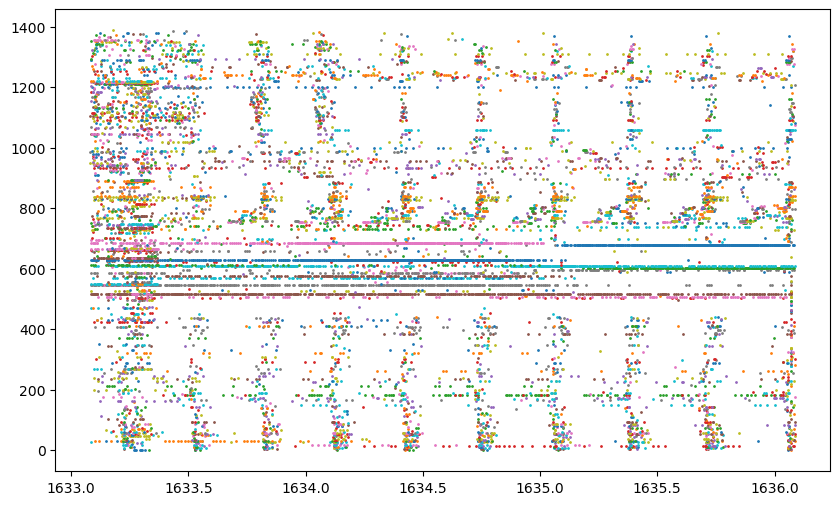

1687.1343 1690.139097979798


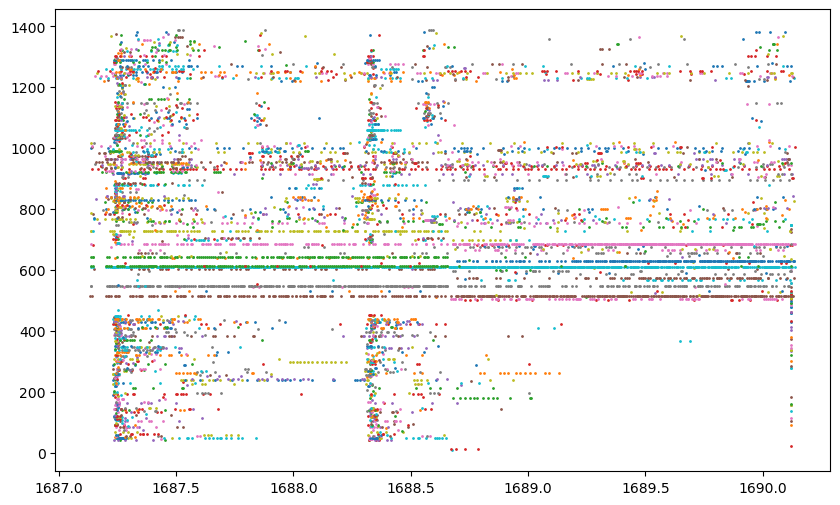

1762.4044666666666 1765.4092646464646


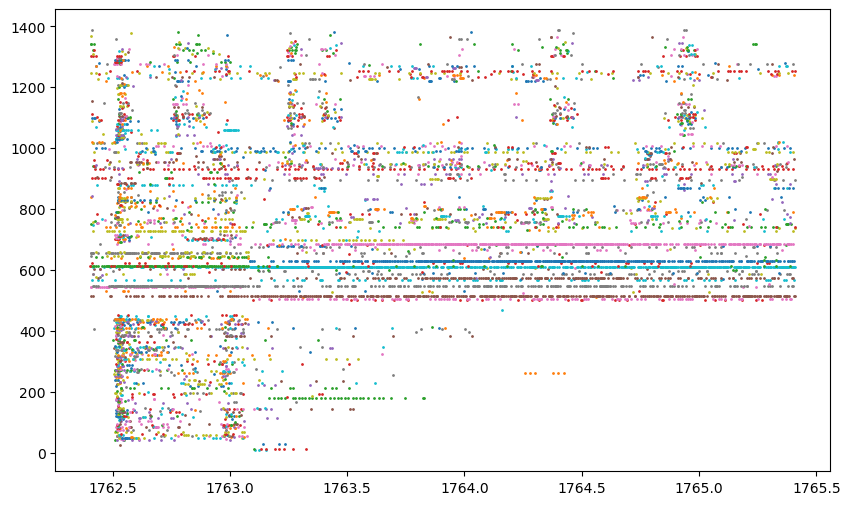

1810.4512 1813.455997979798


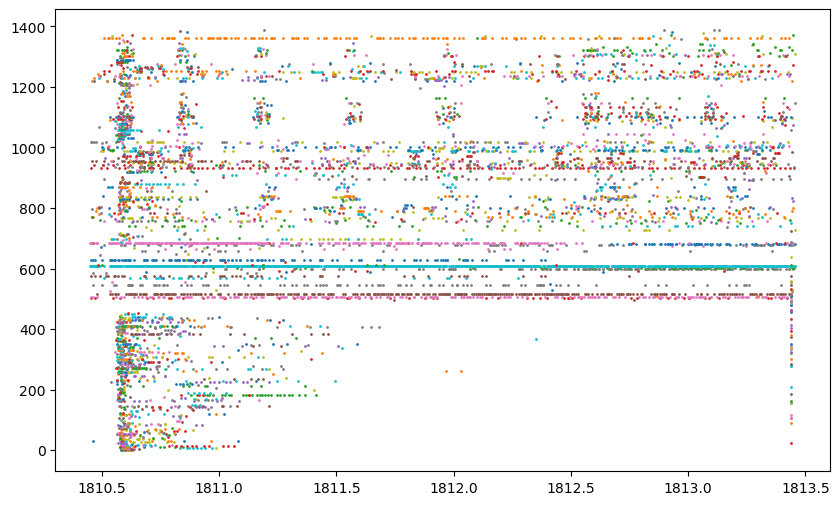

1867.5046666666667 1870.5094646464647


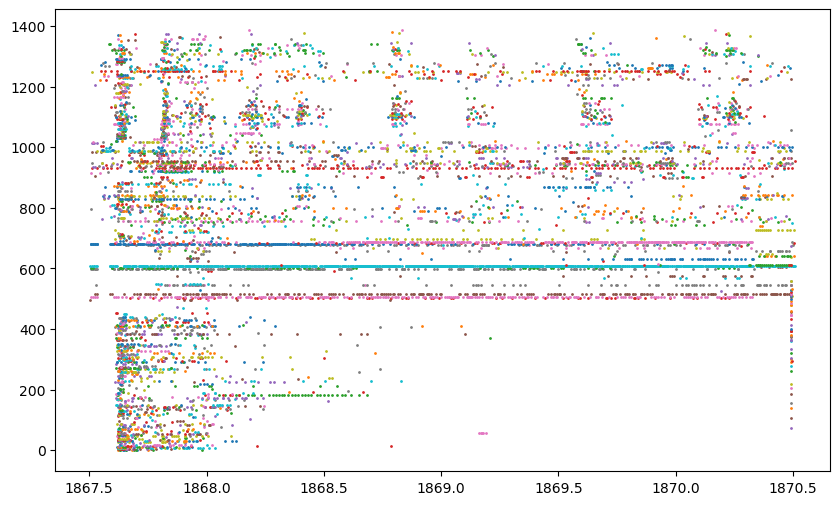

'Optogentic off'

In [36]:
plotter.optogenetic_off_psth(1)
plotter.optogenetic_off_psth(10)
plotter.optogenetic_off_psth(20)
plotter.optogenetic_off_psth(30)
plotter.optogenetic_off_psth(40)

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

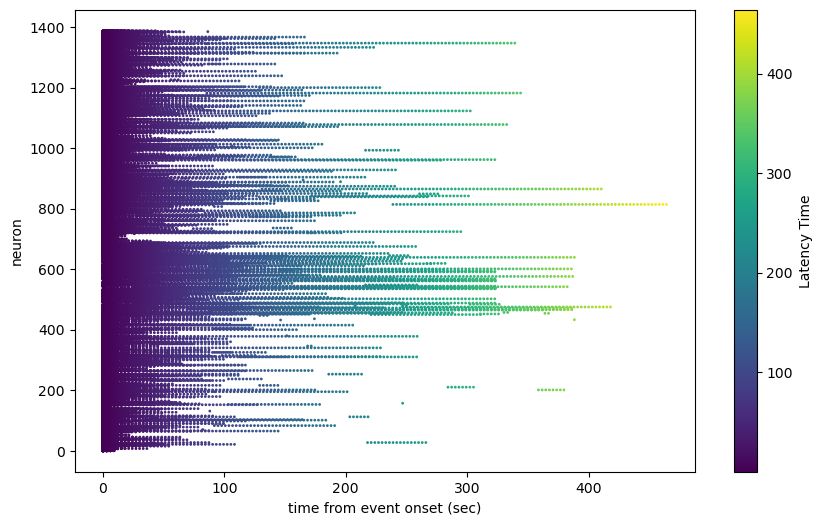

In [218]:
plotter.plot_latency()

In [166]:
neuron = plotter.neural_latency_list()

<Figure size 1000x600 with 0 Axes>

In [182]:
len(neuron[1])

100

In [187]:
latency_spikes[1][0]

2.1142397272528797

In [186]:
latency_spikes[1][-1]

3.1168561839010636

In [146]:
latency_spikes = plotter.first_spike_latency()

<Figure size 1000x600 with 0 Axes>

In [176]:
len(latency_spikes[2])

100

In [14]:
eopn3.trials()

,start_time,stop_time,stimulus,optogenetics_LED_state,flash_luminance,contacts
id,,,,,,
0,1630.086600,1633.091398,luminance_flash,0,0,NaN
1,1633.082600,1636.087398,luminance_flash,0,1,NaN
2,1636.086300,1639.091098,luminance_flash,1,0,NaN
3,1639.088633,1642.093431,luminance_flash,0,1,NaN
4,1642.091526,1645.096324,luminance_flash,0,0,NaN
...,...,...,...,...,...,...
95,1915.549567,1918.554365,luminance_flash,0,1,NaN
96,1918.552900,1921.557698,luminance_flash,1,0,NaN
97,1921.555633,1924.560431,luminance_flash,1,1,NaN


In [13]:
eopn3.units()

,depth,xpos,ypos,label,KSlabel,KSamplitude,KScontamination,probe,spike_times,electrodes,waveform_mean
id,,,,,,,,,,,
0,1013.195409,30.683947,3795.195409,0,1,1016.1,100.2,A,"[1109.4048936263537, 1109.818320648671, 1110.2...",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,938.338041,31.053864,3720.338041,0,1,883.9,80.4,A,"[1108.9367264189364, 1108.938428117146, 1110.3...",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,983.547308,27.801565,3765.547308,0,1,513.9,43.3,A,"[1107.0035413375556, 1107.0217915700377, 1107....",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
3,925.189943,29.911659,3707.189943,0,1,922.2,244.3,A,"[1104.5537168053509, 1106.3120356802092, 1107....",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,973.527915,33.743584,3755.527915,2,2,1129.2,7.4,A,"[1107.0476822106343, 1108.0015932361373, 1108....",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
...,...,...,...,...,...,...,...,...,...,...,...
1384,-2333.371572,26.729427,471.628428,0,1,684.9,0.0,C,"[1134.154436008208, 1508.7308162236252, 1522.1...",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1385,-1154.576101,45.339119,1650.423899,1,2,831.3,100.0,C,"[1116.516382634238, 1119.405341263333, 1121.69...",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1386,-1984.479906,15.740321,820.520094,0,1,1249.9,0.0,C,"[1142.7195634904638, 1166.3699626412435, 1170....",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


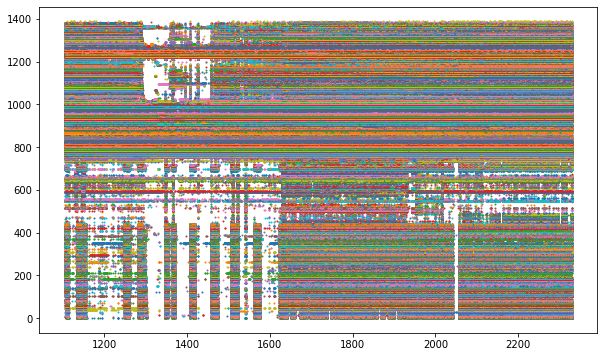

In [341]:
# plotter.all_psth()

1810.4512 1813.455997979798


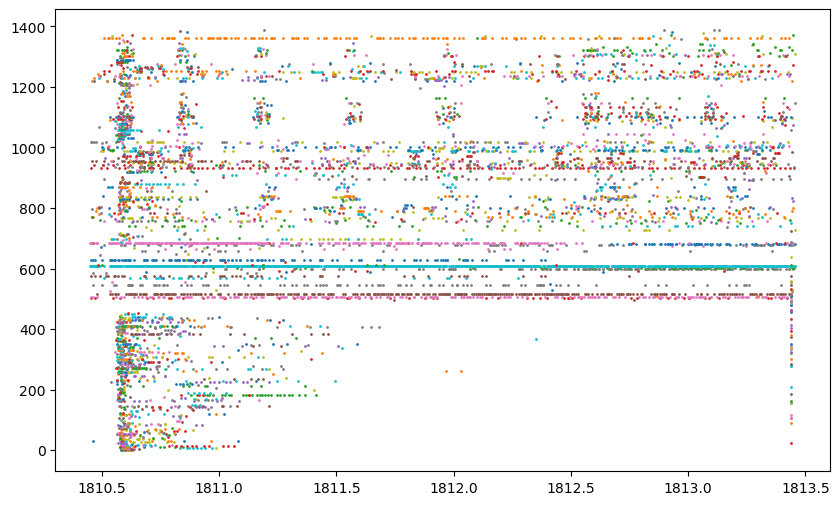

'Optogentic off'

In [8]:
plotter.optogenetic_off_psth(30)

1813.4558 1816.460597979798


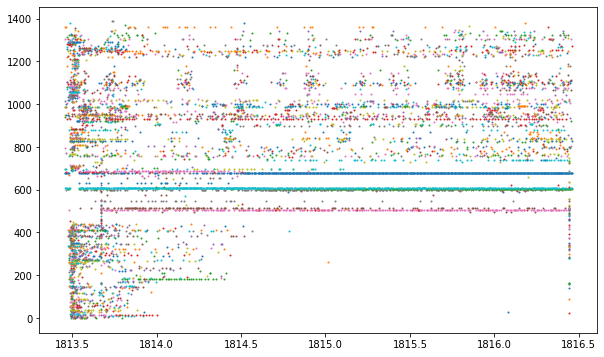

'Optogentic on'

In [345]:
plotter.optogenetic_on_psth(30)

In [330]:
on_windows = structure_data.optogenetics_on_windows()
on_windows

[[1636.0863, 1639.091097979798],
 [1645.0951737692171, 1648.0999717490151],
 [1654.1024, 1657.107197979798],
 [1657.1059333333333, 1660.1107313131313],
 [1660.1087666666667, 1663.1135646464647],
 [1672.1202, 1675.124997979798],
 [1675.1222242758968, 1678.1270222556948],
 [1681.128, 1684.132797979798],
 [1684.1310666666666, 1687.1358646464646],
 [1690.1383666666666, 1693.1431646464646],
 [1693.1401666666666, 1696.1449646464646],
 [1696.1429666666668, 1699.1477646464648],
 [1705.1514, 1708.156197979798],
 [1708.154711207989, 1711.159509187787],
 [1711.1567666666667, 1714.1615646464647],
 [1717.1626333333334, 1720.1674313131314],
 [1720.1654666666666, 1723.1702646464646],
 [1723.1686333333334, 1726.1734313131315],
 [1726.1709333333333, 1729.1757313131313],
 [1729.1743333333334, 1732.1791313131314],
 [1741.3184666666666, 1744.3232646464646],
 [1744.3210333333334, 1747.3258313131314],
 [1747.3236333333334, 1750.3284313131314],
 [1759.4017, 1762.406497979798],
 [1771.4137, 1774.418497979798]

In [295]:
off_windows = structure_data.optogenetics_off_windows()
off_windows
structure_data.opto

[[1630.0866, 1633.091397979798],
 [1633.0826, 1636.087397979798],
 [1639.0886333333333, 1642.0934313131313],
 [1642.0915264263328, 1645.0963244061309],
 [1648.0974666666666, 1651.1022646464646],
 [1651.1004666666668, 1654.1052646464648],
 [1663.1107666666667, 1666.1155646464647],
 [1666.1146333333334, 1669.1194313131314],
 [1669.1172, 1672.121997979798],
 [1678.1251666666667, 1681.1299646464647],
 [1687.1343, 1690.139097979798],
 [1699.1457666666668, 1702.1505646464648],
 [1702.1485333333333, 1705.1533313131313],
 [1714.1594666666667, 1717.1642646464647],
 [1732.1759666666667, 1735.1807646464647],
 [1735.1794333333332, 1738.1842313131312],
 [1738.2989, 1741.303697979798],
 [1750.3271333333332, 1753.3319313131312],
 [1753.3292666666666, 1756.3340646464646],
 [1756.3989666666666, 1759.4037646464647],
 [1762.4044666666666, 1765.4092646464646],
 [1765.4077333333332, 1768.4125313131312],
 [1768.4106666666667, 1771.4154646464647],
 [1774.4160333333334, 1777.4208313131314],
 [1777.41936666666

In [229]:
eopn3.trials_df

,start_time,stop_time,stimulus,optogenetics_LED_state,flash_luminance,contacts
id,,,,,,
0,1630.086600,1633.091398,luminance_flash,0,0,NaN
1,1633.082600,1636.087398,luminance_flash,0,1,NaN
2,1636.086300,1639.091098,luminance_flash,1,0,NaN
3,1639.088633,1642.093431,luminance_flash,0,1,NaN
4,1642.091526,1645.096324,luminance_flash,0,0,NaN
...,...,...,...,...,...,...
95,1915.549567,1918.554365,luminance_flash,0,1,NaN
96,1918.552900,1921.557698,luminance_flash,1,0,NaN
97,1921.555633,1924.560431,luminance_flash,1,1,NaN


In [228]:
structure_data.optogenetics_on_time_windows()

[2,
 5,
 8,
 9,
 10,
 14,
 15,
 17,
 18,
 20,
 21,
 22,
 25,
 26,
 27,
 29,
 30,
 31,
 32,
 33,
 37,
 38,
 39,
 43,
 47,
 52,
 53,
 54,
 55,
 58,
 61,
 62,
 64,
 68,
 69,
 70,
 72,
 74,
 78,
 80,
 82,
 83,
 86,
 87,
 90,
 92,
 96,
 97,
 98,
 99]

In [227]:
spikes.find_spike()

id
0       [1109.4048936263537, 1109.818320648671, 1110.2...
1       [1108.9367264189364, 1108.938428117146, 1110.3...
2       [1107.0035413375556, 1107.0217915700377, 1107....
3       [1104.5537168053509, 1106.3120356802092, 1107....
4       [1107.0476822106343, 1108.0015932361373, 1108....
                              ...                        
1384    [1134.154436008208, 1508.7308162236252, 1522.1...
1385    [1116.516382634238, 1119.405341263333, 1121.69...
1386    [1142.7195634904638, 1166.3699626412435, 1170....
1387    [1500.2487254244165, 1523.0381296577118, 1523....
1388    [1108.526788303513, 1119.4001352960352, 1120.3...
Name: spike_times, Length: 1389, dtype: object


In [202]:
eopn3.units_df

,depth,xpos,ypos,label,KSlabel,KSamplitude,KScontamination,probe,spike_times,electrodes,waveform_mean
id,,,,,,,,,,,
0,1013.195409,30.683947,3795.195409,0,1,1016.1,100.2,A,"[1109.4048936263537, 1109.818320648671, 1110.2...",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,938.338041,31.053864,3720.338041,0,1,883.9,80.4,A,"[1108.9367264189364, 1108.938428117146, 1110.3...",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,983.547308,27.801565,3765.547308,0,1,513.9,43.3,A,"[1107.0035413375556, 1107.0217915700377, 1107....",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
3,925.189943,29.911659,3707.189943,0,1,922.2,244.3,A,"[1104.5537168053509, 1106.3120356802092, 1107....",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,973.527915,33.743584,3755.527915,2,2,1129.2,7.4,A,"[1107.0476822106343, 1108.0015932361373, 1108....",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
...,...,...,...,...,...,...,...,...,...,...,...
1384,-2333.371572,26.729427,471.628428,0,1,684.9,0.0,C,"[1134.154436008208, 1508.7308162236252, 1522.1...",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1385,-1154.576101,45.339119,1650.423899,1,2,831.3,100.0,C,"[1116.516382634238, 1119.405341263333, 1121.69...",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1386,-1984.479906,15.740321,820.520094,0,1,1249.9,0.0,C,"[1142.7195634904638, 1166.3699626412435, 1170....",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


In [201]:
eopn3.trials_df

,start_time,stop_time,stimulus,optogenetics_LED_state,flash_luminance,contacts
id,,,,,,
0,1630.086600,1633.091398,luminance_flash,0,0,NaN
1,1633.082600,1636.087398,luminance_flash,0,1,NaN
2,1636.086300,1639.091098,luminance_flash,1,0,NaN
3,1639.088633,1642.093431,luminance_flash,0,1,NaN
4,1642.091526,1645.096324,luminance_flash,0,0,NaN
...,...,...,...,...,...,...
95,1915.549567,1918.554365,luminance_flash,0,1,NaN
96,1918.552900,1921.557698,luminance_flash,1,0,NaN
97,1921.555633,1924.560431,luminance_flash,1,1,NaN


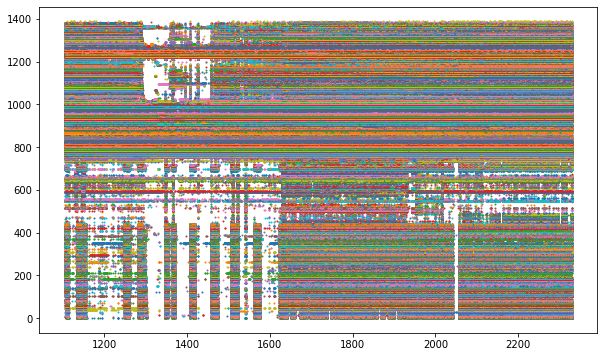

In [195]:
plotter.all_psth()

In [199]:
print(len(structure_data.optogenetics_off_windows()))
print(len(structure_data.optogenetics_time_windows()))

50
50


IndexError: list index out of range

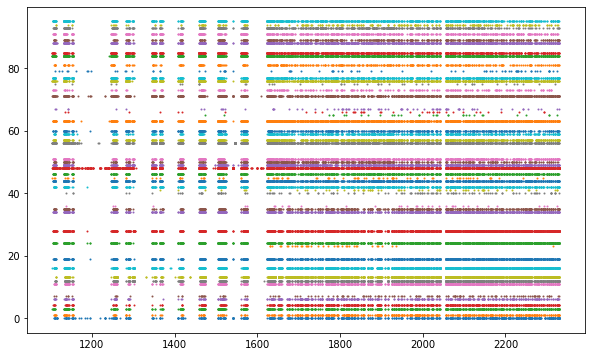

In [196]:
plotter.optogenetic_off_psth()


IndexError: list index out of range

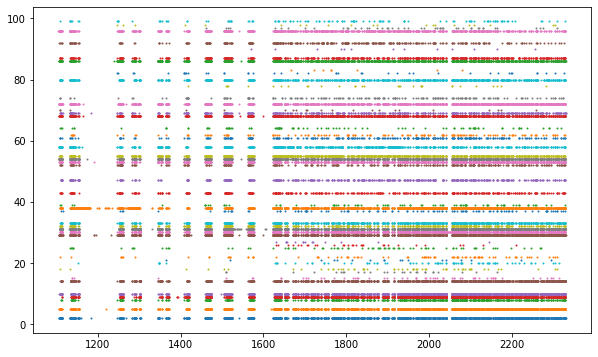

In [149]:
plotter.optogenetic_on_psth()

In [55]:
structure_data.optogenetics_time_windows()

[2,
 5,
 8,
 9,
 10,
 14,
 15,
 17,
 18,
 20,
 21,
 22,
 25,
 26,
 27,
 29,
 30,
 31,
 32,
 33,
 37,
 38,
 39,
 43,
 47,
 52,
 53,
 54,
 55,
 58,
 61,
 62,
 64,
 68,
 69,
 70,
 72,
 74,
 78,
 80,
 82,
 83,
 86,
 87,
 90,
 92,
 96,
 97,
 98,
 99]

AttributeError: 'Eopn3_Ephys' object has no attribute 'trials_df'

In [40]:
eopn3.structure.optogenetics_time_windows()

[2,
 5,
 8,
 9,
 10,
 14,
 15,
 17,
 18,
 20,
 21,
 22,
 25,
 26,
 27,
 29,
 30,
 31,
 32,
 33,
 37,
 38,
 39,
 43,
 47,
 52,
 53,
 54,
 55,
 58,
 61,
 62,
 64,
 68,
 69,
 70,
 72,
 74,
 78,
 80,
 82,
 83,
 86,
 87,
 90,
 92,
 96,
 97,
 98,
 99]

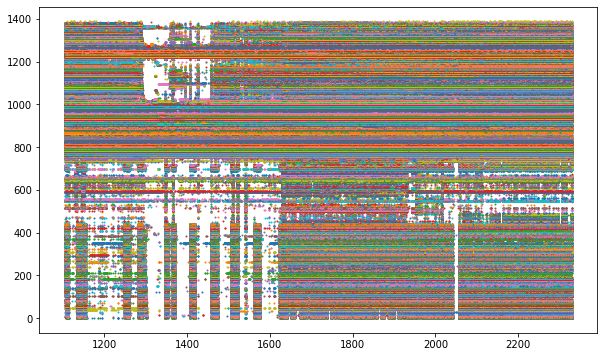

In [9]:
eopn3.plotter.all_psth()

In [84]:
eopn3.units()

,depth,xpos,ypos,label,KSlabel,KSamplitude,KScontamination,probe,spike_times,electrodes,waveform_mean
id,,,,,,,,,,,
0,1013.195409,30.683947,3795.195409,0,1,1016.1,100.2,A,"[1109.4048936263537, 1109.818320648671, 1110.2...",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,938.338041,31.053864,3720.338041,0,1,883.9,80.4,A,"[1108.9367264189364, 1108.938428117146, 1110.3...",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,983.547308,27.801565,3765.547308,0,1,513.9,43.3,A,"[1107.0035413375556, 1107.0217915700377, 1107....",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
3,925.189943,29.911659,3707.189943,0,1,922.2,244.3,A,"[1104.5537168053509, 1106.3120356802092, 1107....",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,973.527915,33.743584,3755.527915,2,2,1129.2,7.4,A,"[1107.0476822106343, 1108.0015932361373, 1108....",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
...,...,...,...,...,...,...,...,...,...,...,...
1384,-2333.371572,26.729427,471.628428,0,1,684.9,0.0,C,"[1134.154436008208, 1508.7308162236252, 1522.1...",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1385,-1154.576101,45.339119,1650.423899,1,2,831.3,100.0,C,"[1116.516382634238, 1119.405341263333, 1121.69...",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1386,-1984.479906,15.740321,820.520094,0,1,1249.9,0.0,C,"[1142.7195634904638, 1166.3699626412435, 1170....",location ...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


[1109.40489363 1109.81832065 1110.2971998  ... 2330.41289321 2330.41452655
 2330.41629321]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

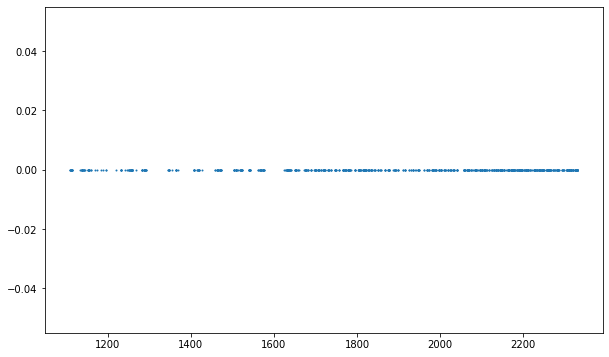

In [70]:
eopn3.all_psth()

In [61]:
# eopn3.trials()

In [42]:
# eopn3.units()

In [46]:
# eopn3.firing_frequency_distribution()

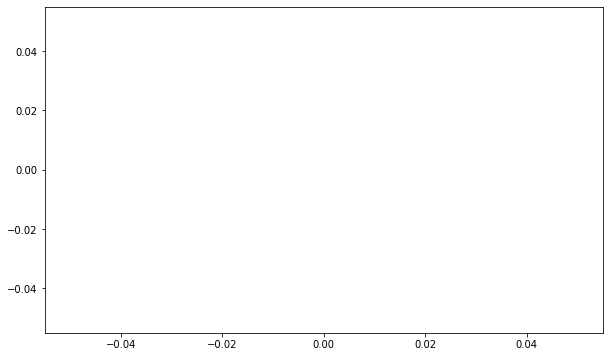

In [50]:
eopn3.multi_neuron_time_psth([],[1600,1610])

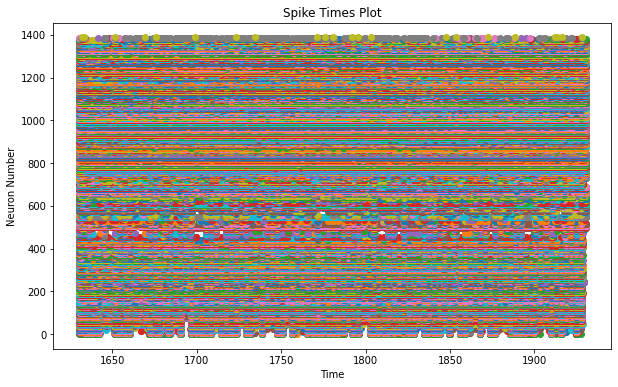

In [47]:
eopn3.plot_run_window(4)

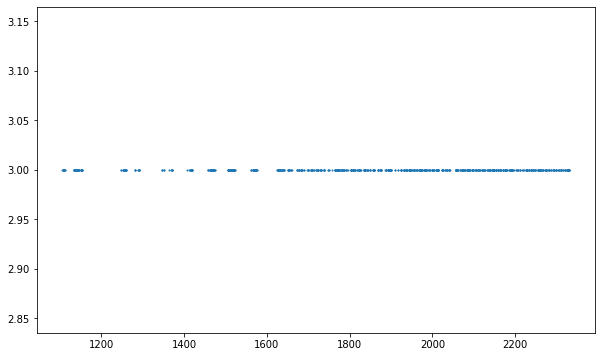

In [16]:
eopn3.single_neuron_psth(3)

In [17]:
eopn3.all_psth()

AttributeError: 'DataFrame' object has no attribute 'run'